# Lead Scoring Case Study - October 2023
### Submitted by : Rohan , Roopa and Rujit
 Date : 23 October 2023

## Problem Statement : 
    
An education company named X Education sells online courses to industry professionals.The company markets its courses on several websites and search engines.Once these people land on the website, they might browse the courses or fill up a form for the course or watch some videos. When these people fill up a form providing their email address or phone number, they are classified to be a lead.The company also gets leads through past referrals. Employees from the sales team start making calls, writing emails, etc to leads. By this, some of the leads get converted while most do not. The typical lead conversion rate at X education is around 30%.
To make this process more efficient, the company wishes to identify the most potential leads, also known as ‘Hot Leads’. If they successfully identify this set of leads, the lead conversion rate should go up as the sales team will now be focusing more on communicating with the potential leads rather than making calls to everyone.

## Goals of the Case Study:- 

1. Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.

2. There are some more problems presented by the company which the model should be able to adjust to if the company's requirement changes in the future so one will need to handle these as well.

# 1. Basic

## 1.1 Import Important libraries

In [1]:
# Pandas is a software library written for the Python programming language for data manipulation and analysis.
import pandas as pd
# NumPy is a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection  of high-level mathematical functions to operate on these arrays.
import numpy as np
# Matplotlib is a plotting library for python and pyplot gives us a MatLab like plotting framework. We will use this in our plotter function to plot data.
import matplotlib.pyplot as plt
%matplotlib inline
#Plotly provides number of trace objects such as scatter, bar, pie, heatmap etc. and each is returned by respective functions in graph_objs functions.
import plotly.graph_objs as go
#To create subplots
from plotly.subplots import make_subplots
#The plotly.express module (usually imported as px) contains functions that can create entire figures at once, and is referred to as Plotly Express or PX.
import plotly.express as px
#Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics
#This affects things like the color of the axes, whether a grid is enabled by default, and other aesthetic elements.
import seaborn as sns;sns.set(style="ticks", color_codes=True)
# Warning Library
import warnings  
# Ignore all warnings
warnings.filterwarnings("ignore")
# import itertools to import
import itertools
# For kde plot visualization
import plotly.figure_factory as ff
# Importing sklearn packages like 
# model_selection - Sklearn's model selection module provides various functions to cross-validate our model, tune the estimator's hyperparameters, or produce validation
# preprocessing - sklearn.preprocessing package provides several common utility functions and transformer classes to change raw feature vectors into a representation that is more suitable for the downstream estimators.
# decomposition - Principal Component Analysis (PCA) primarily permits batch computing, which implies that all of the independent features to be analysed must fit in the storage. Incremental Principal Component Analysis (IPCA) is utilised to overcome this constraint. The sklearn.decomposition module is part of the Scikit-learn ML toolkit. IPCA package that provides the use np.memmap, a memory-mapped document, avoids loading the complete file into ram, permitting the use of its partial fit function on progressively fetched portions of data, or both.
# ensemble - ExtraTressRegressor
# feature_selection - RFE ( Recursive Feaure elimination )
# metrics - r2_score, mean_squared_error, mean_absolute_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA, IncrementalPCA # Optional 
from sklearn.ensemble import ExtraTreesRegressor # Optional 
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve

## 1.2 Setting Option to view data more clearly

In [2]:
# Setting this option will print all collumns of a dataframe
pd.set_option('display.max_columns', None)
# Setting this option will print all of the data in a feature
pd.set_option('display.max_colwidth', None)
# Setting this option will print all of the data in a row
pd.set_option('display.max_rows',None)

## 1.3 Read Data
- Leads.csv
- Leads Data Dictionary.csv

In [3]:
lead_data = pd.read_csv("G:\\My Drive\\Data Science and Machine Learning\\Ritika\\UpGrad\\CaseStudy\\LeadScoring\\Kj\\Lead Scoring Assignment\\Leads.csv")
data_desc = pd.read_csv("G:\\My Drive\\Data Science and Machine Learning\\Ritika\\UpGrad\\CaseStudy\\LeadScoring\\Kj\\Lead Scoring Assignment\\Leads Data Dictionary.csv")

## 1.4 Functions used for EDA

1. Features with NaN values
2. Number of Unique values present in Features

### 1.4.1 Features with NaN values 

Define a function to get <code>Zero Values</code> , <code>Missing Values</code> ,<code>% of Missing Values</code> ,<code>Total Zero and Missing Values</code> ,<code>%Total Zero and Missing Values</code> ,<code>Data Type</code> 

In [4]:
def missing_zero_values_table(df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
        columns = {0 : 'Zero Values', 1 : 'Missing Values', 2 : '% of Missing Values'})
        mz_table['Total Zero and Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['% Total Zero and Missing Values'] = 100 * mz_table['Total Zero and Missing Values'] / len(df)
        mz_table['Data Type'] = df.dtypes
        mz_table = mz_table[
            mz_table.iloc[:,1] != 0].sort_values(
        '% of Missing Values', ascending=False).round(2)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"      
            "There are " + str(mz_table.shape[0]) +
              " columns that have missing values.")
        mz_table.to_csv("G:\\My Drive\\Data Science and Machine Learning\\Ritika\\UpGrad\\CaseStudy\\LeadScoring\\Kj\\features_NaN.csv", index = False)
        return mz_table

### 1.4.2 Number of Unique values present in Features

Define a function to get <code>Features</code>, <code>Count_Unique_values</code>, <code>Unique_values</code>

In [5]:
def number_of_unique_values(df,feat):
    Features = []
    count_unique_values = []
    unique_values = []
    missing_values_count = []
    data_type = []
    
    for feature in df[feat].columns:
        Features.append(feature)
        count_unique_values.append(len(df[feature].unique()))
        unique_values.append(df[feature].unique())
        missing_values_count.append(df[feature].isna().sum())
        data_type.append(df[feature].dtypes)
        
        table = pd.DataFrame({'Features':Features, 'Count_Unique_values':count_unique_values, 'Unique_values':unique_values, "Missing_values_count":missing_values_count, "Data_type":data_type})
    table = table.sort_values(by='Count_Unique_values')
    table.reset_index(drop=True,inplace=True)
    return table

# 2. Data Understanding
1. Shape of Dataset
2. Descriptive view and datatype of features
3. Zero and missing values present in data
4. Features with more than 40% null values
5. Duplicate Analysis
6. Summary of Data Understanding

## 2.1 Shape of Dataset

In [6]:
lead_data.shape

(9240, 37)

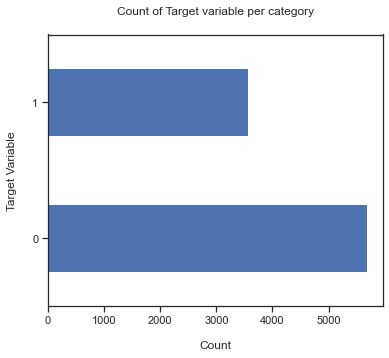

In [7]:
# Plot graph to see target feature properly
lead_data['Converted'].value_counts().plot(kind='barh', figsize=(6,5))
plt.xlabel("Count", labelpad=15)
plt.ylabel("Target Variable", labelpad=15)
plt.title("Count of Target variable per category",y = 1.05);

In [8]:
# Find the percentage of defaulter and repayer
(lead_data['Converted'].value_counts()/lead_data.shape[0])*100

0    61.461039
1    38.538961
Name: Converted, dtype: float64

- Majority of the Leads are not converted into paying customers
- We will further analyse the data to get more insights

## 2.2 Descriptive view and Datatype of features

In [9]:
# Print data describtion
lead_data.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [10]:
dtypes_lead_data = lead_data.dtypes
dtypes_lead_data

Prospect ID                                       object
Lead Number                                        int64
Lead Origin                                       object
Lead Source                                       object
Do Not Email                                      object
Do Not Call                                       object
Converted                                          int64
TotalVisits                                      float64
Total Time Spent on Website                        int64
Page Views Per Visit                             float64
Last Activity                                     object
Country                                           object
Specialization                                    object
How did you hear about X Education                object
What is your current occupation                   object
What matters most to you in choosing a course     object
Search                                            object
Magazine                       

Count of each datatype : 
object     30
float64     4
int64       3
dtype: int64 

Percentage of each datatype % :
object     81.08
float64    10.81
int64       8.11
dtype: float64 



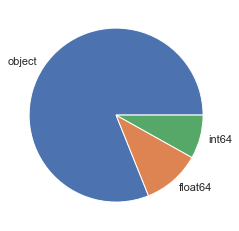

In [11]:
# Total count of each data type
print("Count of each datatype : ")
print(dtypes_lead_data.value_counts(),"\n")
print("Percentage of each datatype % :")
print((dtypes_lead_data.value_counts()/dtypes_lead_data.value_counts().sum()*100).round(2),'\n')
dtypes_lead_data.value_counts().plot.pie()
plt.xlabel("")
plt.ylabel("")
plt.show()

## 2.3 Zero and missing values present in data

- Many columns have a lot of missing data i.e more than 30%. Some columns have few missing data ( 14% to 25% ).
- For features with high number of missing values we will filter and drop columns which are not required
- For features with less number of missing values we can fill with mean or median values or we can predict the missing values with regression

Call function to get <code>Zero Values</code> , <code>Missing Values</code> ,<code>% of Missing Values</code> ,<code>Total Zero and Missing Values</code> ,<code>% Total Zero and Missing Values</code> ,<code>Data Type</code> from the data

In [12]:
null_lead_data_table = missing_zero_values_table(lead_data)
null_lead_data_table

Your selected dataframe has 37 columns and 9240 Rows.
There are 17 columns that have missing values.


,Zero Values,Missing Values,% of Missing Values,Total Zero and Missing Values,% Total Zero and Missing Values,Data Type
Lead Quality,0,4767,51.59,4767,51.59,object
Asymmetrique Profile Score,0,4218,45.65,4218,45.65,float64
Asymmetrique Activity Score,0,4218,45.65,4218,45.65,float64
Asymmetrique Profile Index,0,4218,45.65,4218,45.65,object
Asymmetrique Activity Index,0,4218,45.65,4218,45.65,object
Tags,0,3353,36.29,3353,36.29,object
Lead Profile,0,2709,29.32,2709,29.32,object
What matters most to you in choosing a course,0,2709,29.32,2709,29.32,object
What is your current occupation,0,2690,29.11,2690,29.11,object
Country,0,2461,26.63,2461,26.63,object


## 2.4 Features with more than 40% null values

In [13]:
row_null_40_count = len(null_lead_data_table[null_lead_data_table["% of Missing Values"]>40])
print("Total number of rows having more than 40% null values : ", row_null_40_count)

Total number of rows having more than 40% null values :  5


## 2.5 Duplicate Analysis

In [14]:
print("Total number of duplicate values in Prospect ID column :" , lead_data.duplicated(subset = 'Prospect ID').sum())
print("Total number of duplicate values in Lead Number column :" , lead_data.duplicated(subset = 'Lead Number').sum())

Total number of duplicate values in Prospect ID column : 0
Total number of duplicate values in Lead Number column : 0


## 2.4 Summary of Data Understanding

- There are `9240` rows and `37` columns.
- There are 3 types of datatypes available:
    - object : `30`
    - float : `4`
    - integer : `3`
- There are `17` columns that have missing values with `5` features having more than `40%` missing values.
- There is no duplicate value in this data.


# 3. Data Cleaning

Basic

1. Data Description
2. Drop the features which are not required
3. Divinding data into Numerical and Categorical Features

Handling the missing values of categorical columns individualy

1. Lead Origin
2. Lead Soure
3. City
4. Country
5. Specialization
6. What is your current occupation
7. What matters most to you in choosing a course

Handling the missing values of numerical columns individualy

1. TotalVisits
2. Page Views Per Visit

## 3.1 Basic 

### 3.1.1 Data Description

In [15]:
data_desc

,Variables,Description
0,Prospect ID,A unique ID with which the customer is identified.
1,Lead Number,A lead number assigned to each lead procured.
2,Lead Origin,"The origin identifier with which the customer was identified to be a lead. Includes API, Landing Page Submission, etc."
3,Lead Source,"The source of the lead. Includes Google, Organic Search, Olark Chat, etc."
4,Do Not Email,An indicator variable selected by the customer wherein they select whether of not they want to be emailed about the course or not.
5,Do Not Call,An indicator variable selected by the customer wherein they select whether of not they want to be called about the course or not.
6,Converted,The target variable. Indicates whether a lead has been successfully converted or not.
7,TotalVisits,The total number of visits made by the customer on the website.
8,Total Time Spent on Website,The total time spent by the customer on the website.
9,Page Views Per Visit,Average number of pages on the website viewed during the visits.


### 3.1.2 Drop features which are not required

In [16]:
columns = lead_data.columns

In [17]:
lead_data_unique_values = number_of_unique_values(lead_data, columns)
lead_data_unique_values[lead_data_unique_values['Count_Unique_values']<40]

,Features,Count_Unique_values,Unique_values,Missing_values_count,Data_type
0,Get updates on DM Content,1,[No],0,object
1,I agree to pay the amount through cheque,1,[No],0,object
2,Receive More Updates About Our Courses,1,[No],0,object
3,Magazine,1,[No],0,object
4,Update me on Supply Chain Content,1,[No],0,object
5,Through Recommendations,2,"[No, Yes]",0,object
6,Digital Advertisement,2,"[No, Yes]",0,object
7,Newspaper,2,"[No, Yes]",0,object
8,X Education Forums,2,"[No, Yes]",0,object
9,A free copy of Mastering The Interview,2,"[No, Yes]",0,object


- We can drop features like `Asymmetrique Activity Index`, `Asymmetrique Profile Index`, `Lead Quality`, `How did you hear about X Education`, `Asymmetrique Profile Score`, `Asymmetrique Activity Score`, `Tags`, `Last Notable Activity`, `Lead Quality` as these are of no use.

In [18]:
lead_data_unique_values[lead_data_unique_values['Count_Unique_values']==1]

,Features,Count_Unique_values,Unique_values,Missing_values_count,Data_type
0,Get updates on DM Content,1,[No],0,object
1,I agree to pay the amount through cheque,1,[No],0,object
2,Receive More Updates About Our Courses,1,[No],0,object
3,Magazine,1,[No],0,object
4,Update me on Supply Chain Content,1,[No],0,object


- We will drop the features like `Get updates on DM Content`, `I agree to pay the amount throught cheque`, `Receive More Updates About Our Courses`, `Magazines`, `Update me on Supply Chain Content` as they are having one unique value.

In [19]:
lead_data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


- After checking the above data we can drop `Prospect ID`, `Lead Number` columns

In [20]:
columns_to_drop = ['Prospect ID','Lead Number','How did you hear about X Education',
                'Lead Quality','Asymmetrique Profile Score','Asymmetrique Activity Score',
               'Asymmetrique Activity Index','Asymmetrique Profile Index','Tags','Last Notable Activity',
                   'Get updates on DM Content', 'I agree to pay the amount through cheque', 'Receive More Updates About Our Courses', 
                   'Magazine', 'Update me on Supply Chain Content', 'Lead Profile']

In [21]:
lead_data.drop(columns_to_drop, axis=1, inplace=True)

### 3.1.3 Divinding data into Numerical and Categorical Features

In [22]:
numerical_features = [feature for feature in lead_data.columns if lead_data[feature].dtype != "object"]
print(f'Number of Numerical Variables: {len(numerical_features)}')

Number of Numerical Variables: 4


In [23]:
numerical_features

['Converted',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit']

In [24]:
lead_data['Total Time Spent on Website'].isnull().sum()

0

In [25]:
categorical_features = [feature for feature in lead_data.columns if lead_data[feature].dtype == "object"]
print(f'Number of Numerical Variables: {len(numerical_features)}')

Number of Numerical Variables: 4


In [26]:
categorical_features

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Last Activity',
 'Country',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Search',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'City',
 'A free copy of Mastering The Interview']

## 3.2 Handling the missing values of categorical columns individualy

### 3.2.1 Lead Origin

In [27]:
print("Number of null values in Lead Source column is : ", lead_data['Lead Origin'].isnull().sum())
print("Percentage of null values in Lead Source column is : ", round(lead_data['Lead Origin'].isnull().sum()/lead_data.shape[0]*100,2))

Number of null values in Lead Source column is :  0
Percentage of null values in Lead Source column is :  0.0


In [28]:
lead_data['Lead Origin'].value_counts(normalize = True)*100

Landing Page Submission    52.878788
API                        38.744589
Lead Add Form               7.770563
Lead Import                 0.595238
Quick Add Form              0.010823
Name: Lead Origin, dtype: float64

In [29]:
lead_data['Lead Source'] = lead_data['Lead Source'].replace(np.nan, 'Google')
lead_data['Lead Source'] = lead_data['Lead Source'].replace('google', 'Google')
print("Number of null values in Lead Source column is : ", lead_data['Lead Source'].isnull().sum())

Number of null values in Lead Source column is :  0


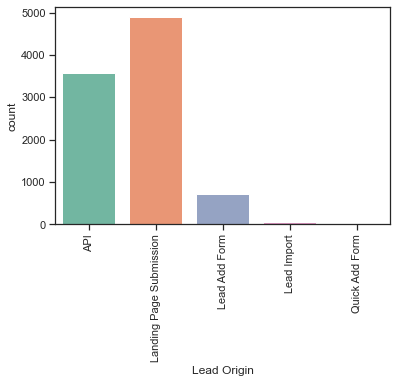

In [30]:
sns.countplot(lead_data['Lead Origin'],palette = 'Set2')
plt.xticks(rotation = 90)
plt.show()

### 3.2.2 Lead Source

In [31]:
print("Number of null values in Lead Source column is : ", lead_data['Lead Source'].isnull().sum())
print("Percentage of null values in Lead Source column is : ", round(lead_data['Lead Source'].isnull().sum()/lead_data.shape[0]*100,2))

Number of null values in Lead Source column is :  0
Percentage of null values in Lead Source column is :  0.0


In [32]:
lead_data['Lead Source'].value_counts(normalize = True)*100

Google               31.482684
Direct Traffic       27.521645
Olark Chat           18.993506
Organic Search       12.489177
Reference             5.779221
Welingak Website      1.536797
Referral Sites        1.352814
Facebook              0.595238
bing                  0.064935
Click2call            0.043290
Social Media          0.021645
Live Chat             0.021645
Press_Release         0.021645
Pay per Click Ads     0.010823
blog                  0.010823
WeLearn               0.010823
welearnblog_Home      0.010823
youtubechannel        0.010823
testone               0.010823
NC_EDM                0.010823
Name: Lead Source, dtype: float64

In [33]:
lead_data['Lead Source'] = lead_data['Lead Source'].replace(np.nan, 'Google')
lead_data['Lead Source'] = lead_data['Lead Source'].replace('google', 'Google')
print("Number of null values in Lead Source column is : ", lead_data['Lead Source'].isnull().sum())

Number of null values in Lead Source column is :  0


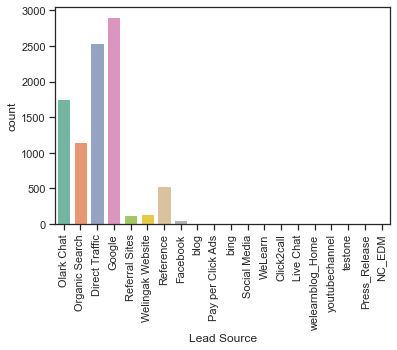

In [34]:
sns.countplot(lead_data['Lead Source'],palette = 'Set2')
plt.xticks(rotation = 90)
plt.show()

### 3.2.3 City

In [35]:
lead_data['City'].value_counts(normalize=True)*100

Mumbai                         41.202046
Select                         28.759591
Thane & Outskirts               9.616368
Other Cities                    8.772379
Other Cities of Maharashtra     5.843990
Other Metro Cities              4.859335
Tier II Cities                  0.946292
Name: City, dtype: float64

In [36]:
# Let's check how City and Country are connected with each other
lead_data.groupby(['Country','City'])['Country'].count()

Country               City                       
Australia             Mumbai                            6
                      Other Cities                      2
                      Select                            1
                      Thane & Outskirts                 3
Bahrain               Mumbai                            1
                      Other Cities                      2
                      Other Cities of Maharashtra       1
                      Thane & Outskirts                 2
                      Tier II Cities                    1
Bangladesh            Other Cities                      2
Belgium               Mumbai                            1
                      Thane & Outskirts                 1
Canada                Mumbai                            3
China                 Mumbai                            1
                      Select                            1
Denmark               Other Cities                      1
France                

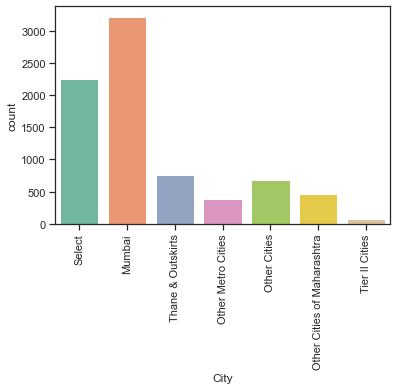

In [37]:
sns.countplot(lead_data['City'],palette = 'Set2')
plt.xticks(rotation = 90)
plt.show()

### 3.2.4 Country

In [38]:
#Let's check how is the Country data distributed
lead_data['Country'].value_counts(normalize=True)

India                   0.957663
United States           0.010178
United Arab Emirates    0.007818
Singapore               0.003540
Saudi Arabia            0.003098
United Kingdom          0.002213
Australia               0.001918
Qatar                   0.001475
Hong Kong               0.001033
Bahrain                 0.001033
Oman                    0.000885
France                  0.000885
unknown                 0.000738
South Africa            0.000590
Nigeria                 0.000590
Germany                 0.000590
Kuwait                  0.000590
Canada                  0.000590
Sweden                  0.000443
China                   0.000295
Asia/Pacific Region     0.000295
Uganda                  0.000295
Bangladesh              0.000295
Italy                   0.000295
Belgium                 0.000295
Netherlands             0.000295
Ghana                   0.000295
Philippines             0.000295
Russia                  0.000148
Switzerland             0.000148
Vietnam   

- Country data is heavily skewed as 95% of the data is of `India`. Similar to City, Country data is not required for Model building as X-Education is an online platform. Hence we will drop this column

In [39]:
lead_data.drop('Country', axis = 1, inplace = True)
len(lead_data.columns)

20

### 3.2.5 Specialization

In [40]:
lead_data['Specialization'].value_counts(normalize = True)*100

Select                               24.891054
Finance Management                   12.509613
Human Resource Management            10.869008
Marketing Management                 10.740836
Operations Management                 6.447065
Business Administration               5.165342
IT Projects Management                4.691105
Supply Chain Management               4.473212
Banking, Investment And Insurance     4.332223
Travel and Tourism                    2.601897
Media and Advertising                 2.601897
International Business                2.281466
Healthcare Management                 2.037939
Hospitality Management                1.461164
E-COMMERCE                            1.435529
Retail Management                     1.281723
Rural and Agribusiness                0.935658
E-Business                            0.730582
Services Excellence                   0.512689
Name: Specialization, dtype: float64

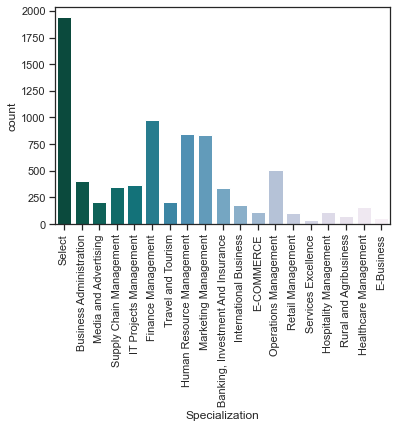

In [41]:
sns.countplot(lead_data['Specialization'],palette = 'PuBuGn_r')
plt.xticks(rotation = 90)
plt.show()

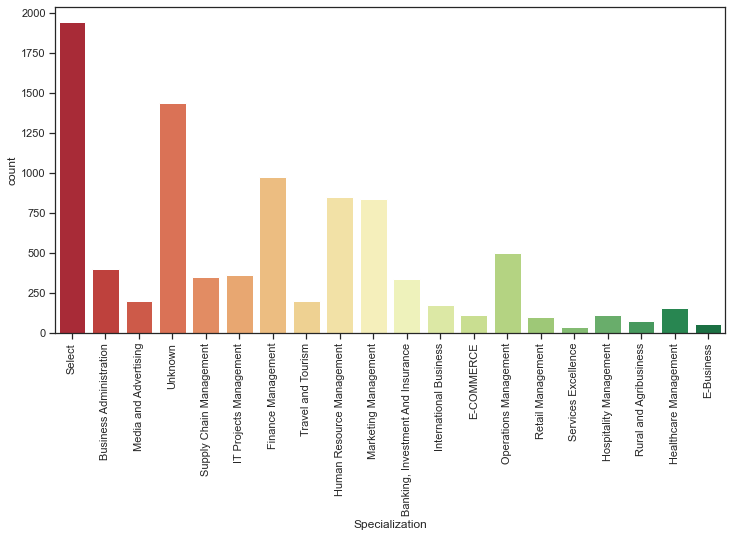

In [42]:
lead_data['Specialization'] = lead_data['Specialization'].replace(np.nan, 'Unknown')
plt.figure(figsize=(12,6))
ax = sns.countplot(lead_data['Specialization'],palette = 'RdYlGn')
plt.xticks(rotation = 90)
plt.show()


### 3.2.6 What is your current occupation

In [43]:
lead_data['What is your current occupation'].value_counts(normalize=True)*100

Unemployed              85.496183
Working Professional    10.778626
Student                  3.206107
Other                    0.244275
Housewife                0.152672
Businessman              0.122137
Name: What is your current occupation, dtype: float64

In [44]:
lead_data['What is your current occupation'] = lead_data['What is your current occupation'].replace(np.nan, 'Unknown')
lead_data['What is your current occupation'].value_counts(normalize = True)*100

Unemployed              60.606061
Unknown                 29.112554
Working Professional     7.640693
Student                  2.272727
Other                    0.173160
Housewife                0.108225
Businessman              0.086580
Name: What is your current occupation, dtype: float64

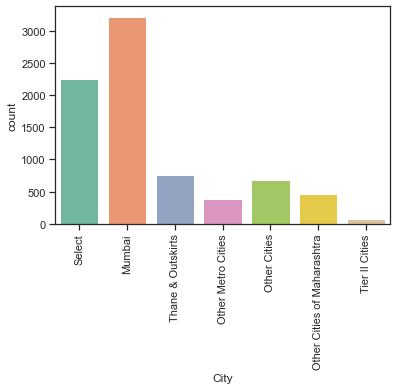

In [45]:
sns.countplot(lead_data['City'],palette = 'Set2')
plt.xticks(rotation = 90)
plt.show()

### 3.2.7 What matters most to you in choosing a course

In [46]:
lead_data['What matters most to you in choosing a course'].value_counts(normalize = True)*100

Better Career Prospects      99.954065
Flexibility & Convenience     0.030623
Other                         0.015312
Name: What matters most to you in choosing a course, dtype: float64

- `What matters most to you in choosing a course` is skewed, we can delete the column.

In [47]:
lead_data.drop('What matters most to you in choosing a course', axis = 1, inplace=True)
len(lead_data.columns)

19

## 3.3 Handling the missing values of categorical columns individualy

### 3.3.1 TotalVisits

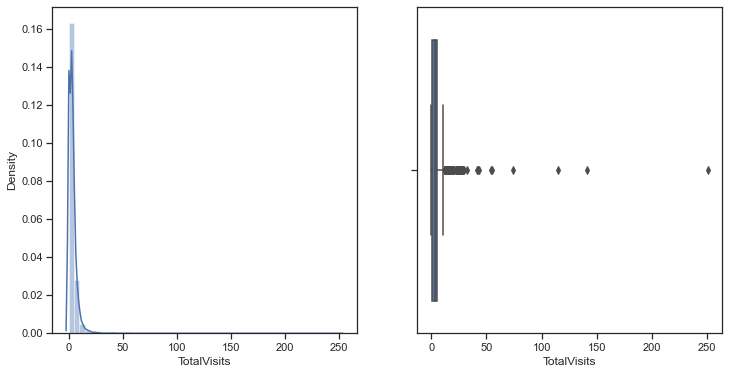

In [48]:
plt.figure(figsize = (12,6))
plt.subplot(1,2,1)
sns.distplot(lead_data['TotalVisits'])
plt.subplot(1,2,2)
sns.boxplot(lead_data['TotalVisits'])
plt.show()

- As we see there are some outliers in the data, we will impute with median and not mean value.

In [49]:
lead_data['TotalVisits'].fillna(lead_data['TotalVisits'].median(), inplace=True)
lead_data['TotalVisits'].isnull().sum()

0

### 3.3.2 Page Views Per Visit

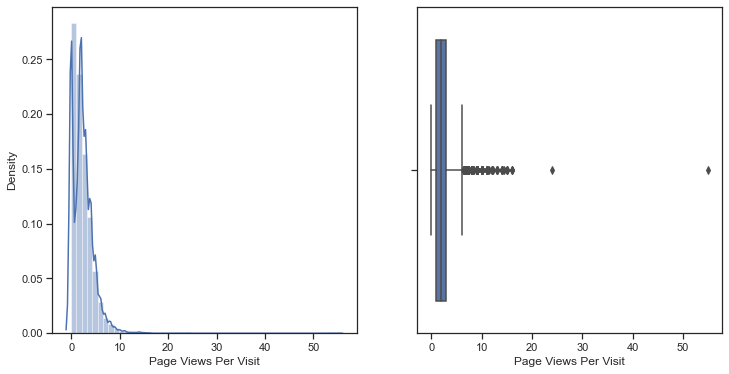

In [50]:
plt.figure(figsize = (12,6))
plt.subplot(1,2,1)
sns.distplot(lead_data['Page Views Per Visit'])
plt.subplot(1,2,2)
sns.boxplot(lead_data['Page Views Per Visit'])
plt.show()

- As we see there are some outliers in the data, we will impute with median and not mean value.

In [51]:
lead_data['Page Views Per Visit'].fillna(lead_data['Page Views Per Visit'].median(), inplace=True)
lead_data['Page Views Per Visit'].isnull().sum()

0

# 4. Exploratory Data Analysis

1. Data Imbalance
2. Graph Functions
3. Univariate Analysis - Categorical
    - Lead Origin
    - Lead Source
    - Do not Email
    - Last Activity
    - Specialization
    - Occupation
    - Search, Newspaper Article, X Education Forums, Newspaper, Digital Advertisement, Through Recommendations, City, A free copy of Mastering The Interview
    
4. Univariate Analysis - Numerical
    - Converted, TotalVisits, Total Time Spent on Website, Page Views Per Visit
5. Bi-Variate Analysis

## 4.1 Data Imbalance

In [52]:
lead_data['Converted'].value_counts()

0    5679
1    3561
Name: Converted, dtype: int64

- There are more number of unsuccessful leads than successful leads

## 4.2 Graph Functions

In [53]:
# Function for plotting countplots in univariate categorical analysis
def univariate_categorical(feature):
    temp_count = lead_data[feature].value_counts()
    temp_perc = lead_data[feature].value_counts(normalize = True)
    df = pd.DataFrame({feature: temp_count.index,'Total Leads': temp_count.values,'% Values': temp_perc.values * 100})
    print(df,'\n')
    
    # Calculate the percentage of Converted=1 per category value
    cat_perc = lead_data[[feature, 'Converted']].groupby([feature],as_index=False).mean()
    cat_perc["Converted"] = cat_perc["Converted"]*100
    cat_perc.sort_values(by='Converted', ascending=False, inplace=True)
    
    # Graph 1
    df2 = pd.DataFrame(lead_data.groupby(feature)["Converted"].value_counts().reset_index(name="Counts"))
    fig = px.histogram(
        data_frame=df2,
        x=feature,
        y="Counts",
        barmode="group",
        color= "Converted",
        title=feature,orientation="v",
        height= 500,
        text_auto=True)
    fig.update_layout(xaxis_title=feature, yaxis_title="Count")
    fig.show()
    
    # Graph 2
    fig = px.bar(
        data_frame=cat_perc,
        y= feature,
        x= "Converted",
        height= 500,
        width= 800,
        text_auto=True,
        orientation="h"
    )
    fig.update_layout(xaxis_title=feature, yaxis_title="Percent of Converted Leads [%]")
    fig.show()

- Most of the features in the dataset are categorical. Let us begin our analysis by performing segmented univariate analysis on each categorical feature. We will view bar plots that will show the total count of converted and non-converted leads in every category.

In [54]:
# Renaming some of the column headers which has long header

lead_data.rename(columns={'What is your current occupation': 'Occupation', 
                     'Through Recommendations': 'Recommendation',
                     'A free copy of Mastering The Interview': 'Free Copy'                   
                    },inplace = True)
lead_data.columns

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Do Not Call',
       'Converted', 'TotalVisits', 'Total Time Spent on Website',
       'Page Views Per Visit', 'Last Activity', 'Specialization', 'Occupation',
       'Search', 'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Recommendation', 'City', 'Free Copy'],
      dtype='object')

## 4.3 Univariate Analysis - Categorical

### 4.3.1 Lead Origin

               Lead Origin  Total Leads   % Values
0  Landing Page Submission         4886  52.878788
1                      API         3580  38.744589
2            Lead Add Form          718   7.770563
3              Lead Import           55   0.595238
4           Quick Add Form            1   0.010823 



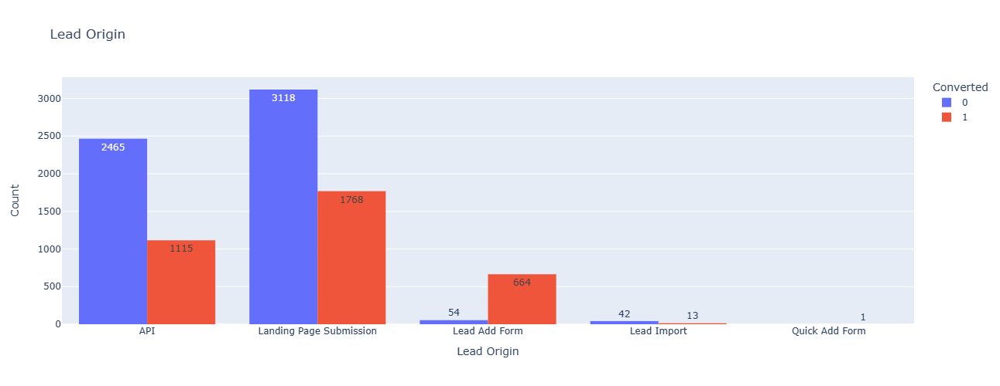

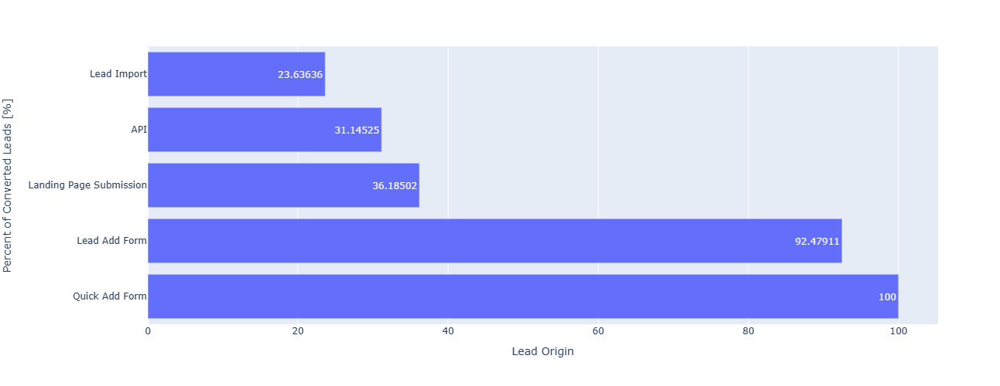

In [55]:
univariate_categorical("Lead Origin")

- Most Leads originated from submissions on the landing page and around 38% of those are converted followed by API, where around 30% are converted.
- Even though Lead Origins from Quick Add Form are 100% Converted, there was just 1 lead from that category. Leads from the Lead Add Form are the next highest conversions in this category at around 90% of 718 leads.
- Lead Import are very less in count and conversion rate is also the lowest

To improve overall lead conversion rate, we need to focus more on improving lead converion of API and Landing Page Submission origin and generate more leads from Lead Add Form.

### 4.3.2 Lead Source

          Lead Source  Total Leads   % Values
0              Google         2909  31.482684
1      Direct Traffic         2543  27.521645
2          Olark Chat         1755  18.993506
3      Organic Search         1154  12.489177
4           Reference          534   5.779221
5    Welingak Website          142   1.536797
6      Referral Sites          125   1.352814
7            Facebook           55   0.595238
8                bing            6   0.064935
9          Click2call            4   0.043290
10       Social Media            2   0.021645
11          Live Chat            2   0.021645
12      Press_Release            2   0.021645
13  Pay per Click Ads            1   0.010823
14               blog            1   0.010823
15            WeLearn            1   0.010823
16   welearnblog_Home            1   0.010823
17     youtubechannel            1   0.010823
18            testone            1   0.010823
19             NC_EDM            1   0.010823 



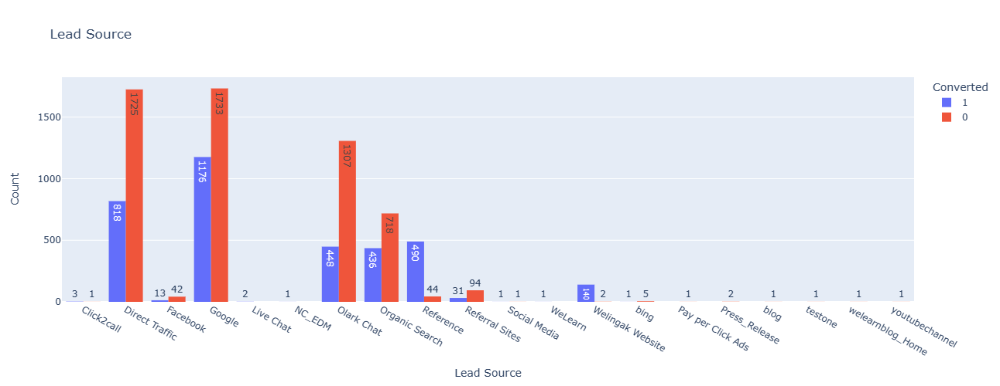

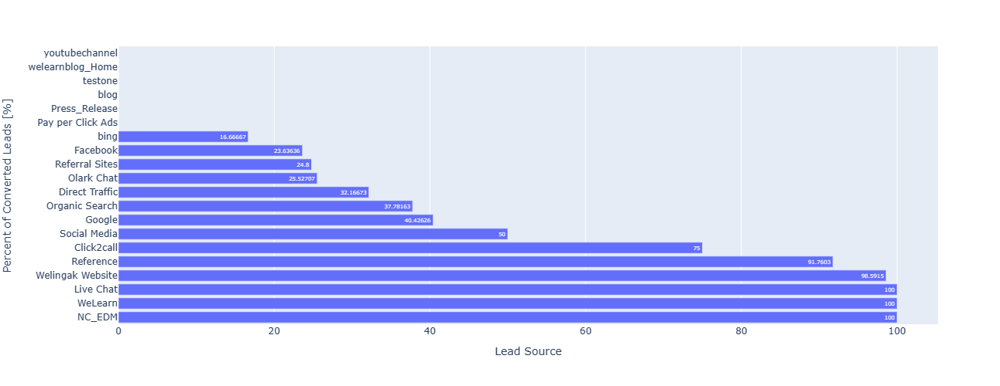

In [56]:
univariate_categorical("Lead Source")

- Let's combine smaller lead source as others

In [57]:
lead_data['Lead Source'] = lead_data['Lead Source'].replace(['Click2call', 'Live Chat', 'NC_EDM', 'Pay per Click Ads', 'Press_Release',
  'Social Media', 'WeLearn', 'bing', 'blog', 'testone', 'welearnblog_Home', 'youtubechannel'], 'Other Sources')

        Lead Source  Total Leads   % Values
0            Google         2909  31.482684
1    Direct Traffic         2543  27.521645
2        Olark Chat         1755  18.993506
3    Organic Search         1154  12.489177
4         Reference          534   5.779221
5  Welingak Website          142   1.536797
6    Referral Sites          125   1.352814
7          Facebook           55   0.595238
8     Other Sources           23   0.248918 



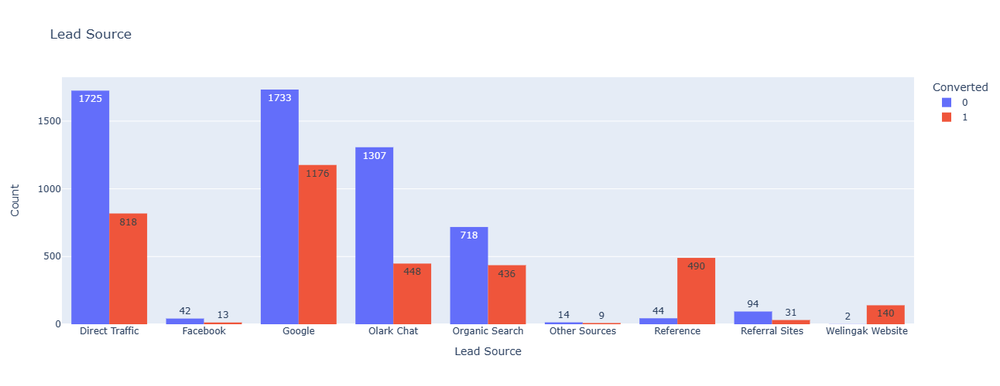

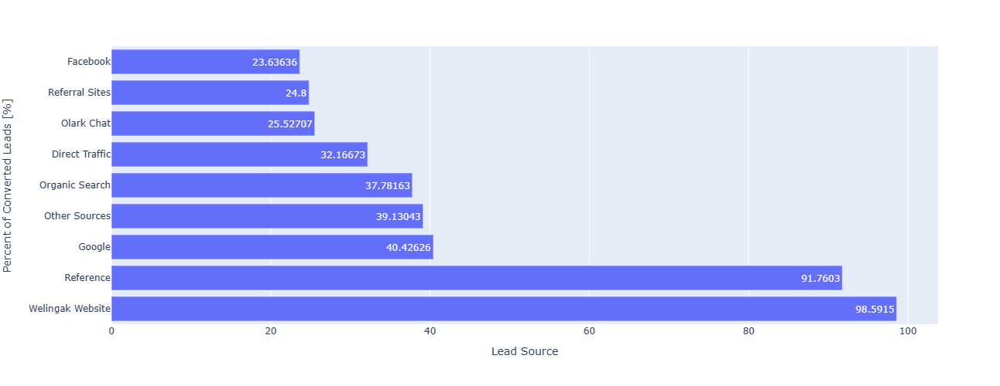

In [58]:
univariate_categorical("Lead Source")

### 4.3.3 Do Not Email

  Do Not Email  Total Leads   % Values
0           No         8506  92.056277
1          Yes          734   7.943723 



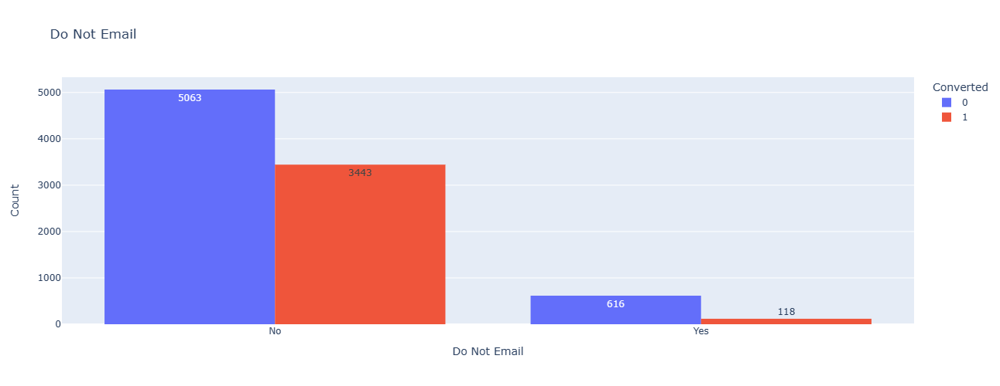

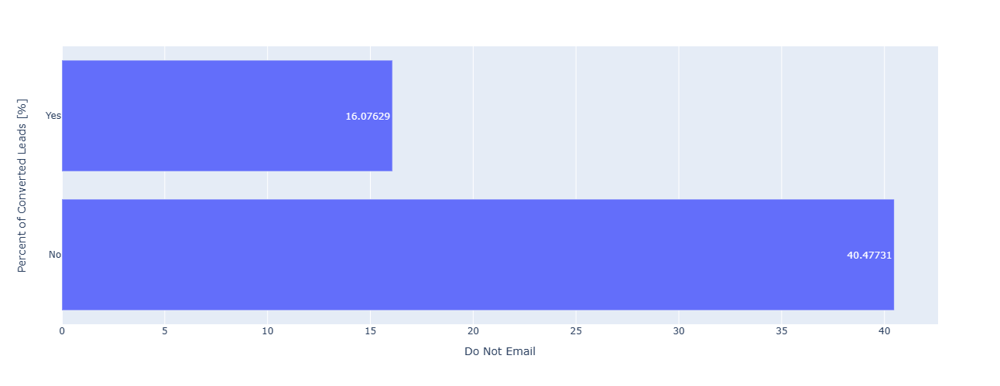

In [59]:
univariate_categorical("Do Not Email")

- Majority of the people are ok with receiving email (~92%)
- People who are ok with email has conversion rate of 40%
- People who have opted out of receive email has lower rate of conversion (only 15%)

### 4.3.4 Last Activity

                   Last Activity  Total Leads   % Values
0                   Email Opened         3437  37.616285
1                       SMS Sent         2745  30.042684
2        Olark Chat Conversation          973  10.649010
3        Page Visited on Website          640   7.004487
4              Converted to Lead          428   4.684251
5                  Email Bounced          326   3.567911
6             Email Link Clicked          267   2.922185
7      Form Submitted on Website          116   1.269563
8                    Unreachable           93   1.017840
9                   Unsubscribed           61   0.667615
10      Had a Phone Conversation           30   0.328335
11            Approached upfront            9   0.098501
12  View in browser link Clicked            6   0.065667
13                Email Received            2   0.021889
14             Email Marked Spam            2   0.021889
15    Visited Booth in Tradeshow            1   0.010945
16        Resubscribed to email

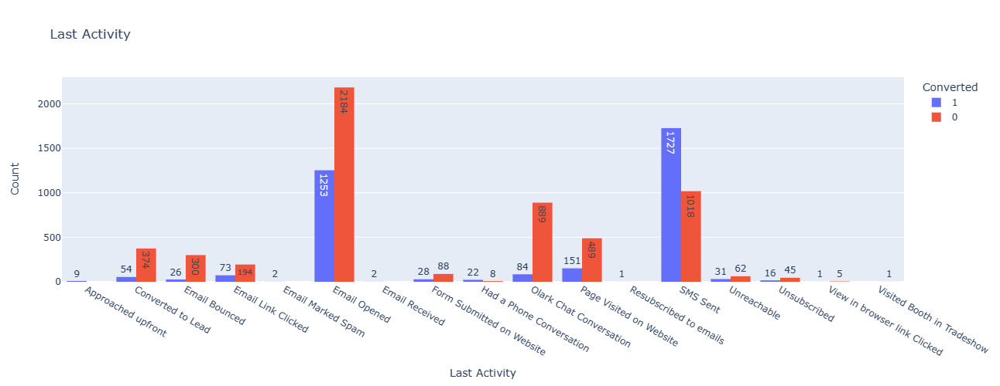

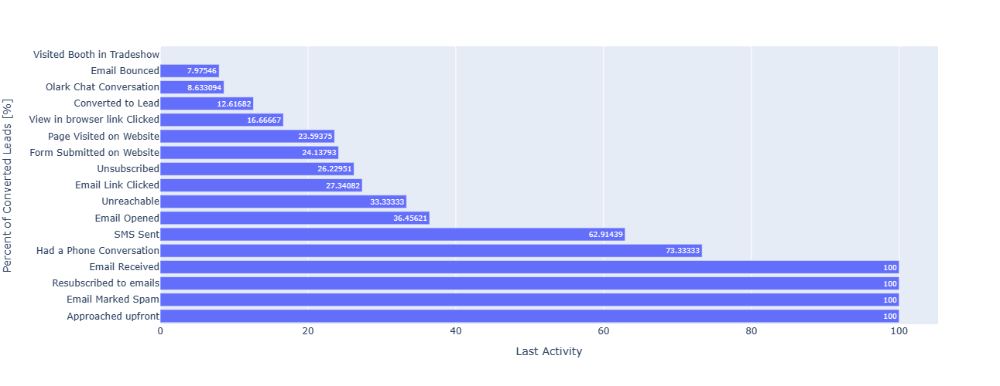

In [60]:
univariate_categorical("Last Activity")

- Let's combine smaller last activities to others

In [61]:
lead_data['Last Activity'] = lead_data['Last Activity'].replace(['Had a Phone Conversation', 'View in browser link Clicked', 
                                                       'Visited Booth in Tradeshow', 'Approached upfront',
                                                       'Resubscribed to emails','Email Received', 'Email Marked Spam'], 'Other Activity')

                Last Activity  Total Leads   % Values
0                Email Opened         3437  37.616285
1                    SMS Sent         2745  30.042684
2     Olark Chat Conversation          973  10.649010
3     Page Visited on Website          640   7.004487
4           Converted to Lead          428   4.684251
5               Email Bounced          326   3.567911
6          Email Link Clicked          267   2.922185
7   Form Submitted on Website          116   1.269563
8                 Unreachable           93   1.017840
9                Unsubscribed           61   0.667615
10             Other Activity           51   0.558170 



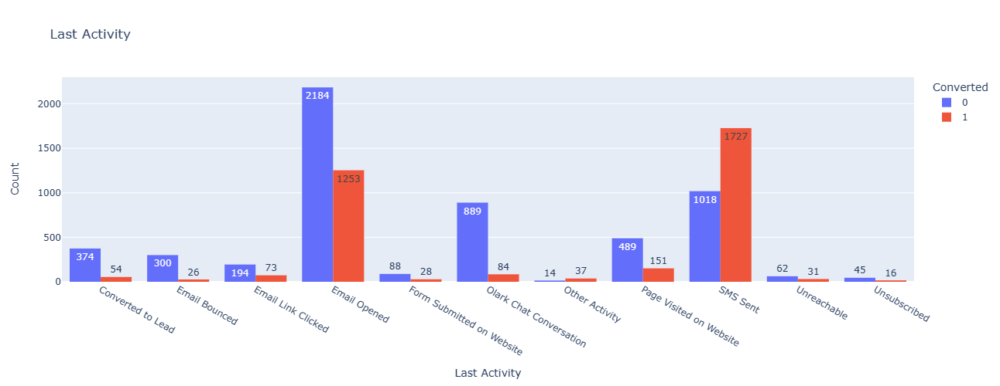

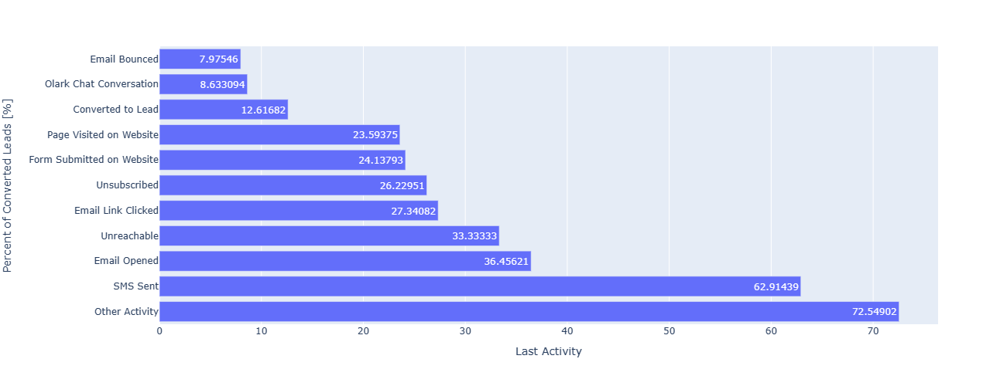

In [62]:
univariate_categorical("Last Activity")

### 4.3.5 Specialization

                       Specialization  Total Leads   % Values
0                              Select         1942  21.017316
1                             Unknown         1438  15.562771
2                  Finance Management          976  10.562771
3           Human Resource Management          848   9.177489
4                Marketing Management          838   9.069264
5               Operations Management          503   5.443723
6             Business Administration          403   4.361472
7              IT Projects Management          366   3.961039
8             Supply Chain Management          349   3.777056
9   Banking, Investment And Insurance          338   3.658009
10                 Travel and Tourism          203   2.196970
11              Media and Advertising          203   2.196970
12             International Business          178   1.926407
13              Healthcare Management          159   1.720779
14             Hospitality Management          114   1.233766
15      

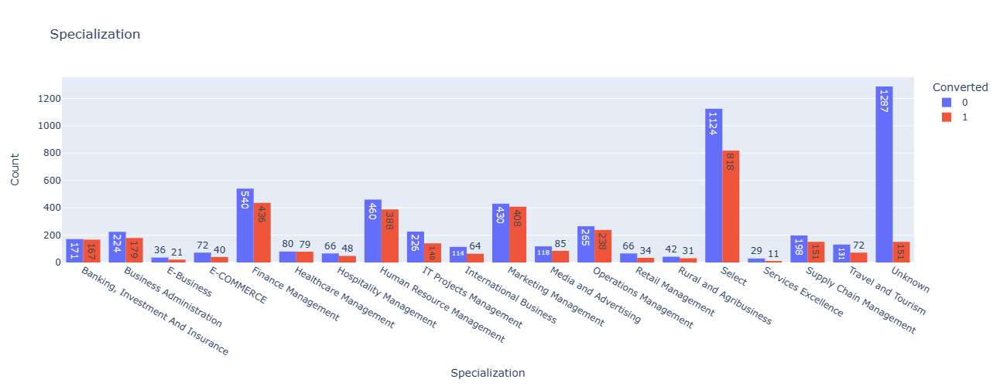

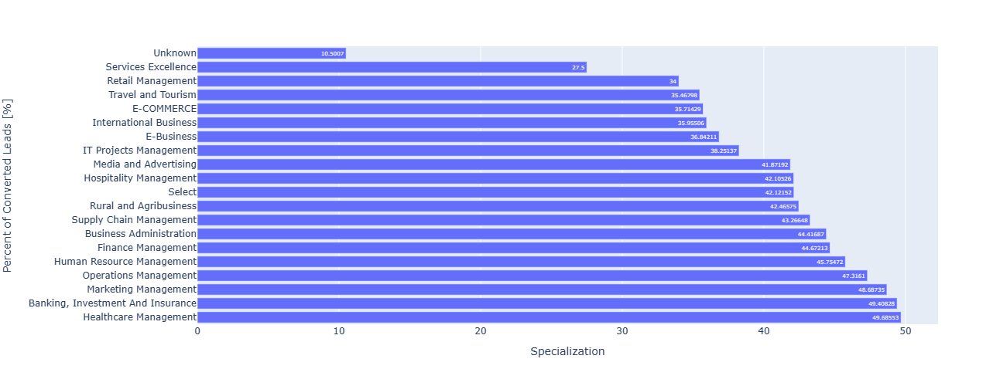

In [63]:
univariate_categorical("Specialization")

- Most of the leads have not mentioned a specialization and around 28% of those converted
- Leads with Finance management and Marketing Management - Over 45% Converted

### 4.3.6 Occupation

             Occupation  Total Leads   % Values
0            Unemployed         5600  60.606061
1               Unknown         2690  29.112554
2  Working Professional          706   7.640693
3               Student          210   2.272727
4                 Other           16   0.173160
5             Housewife           10   0.108225
6           Businessman            8   0.086580 



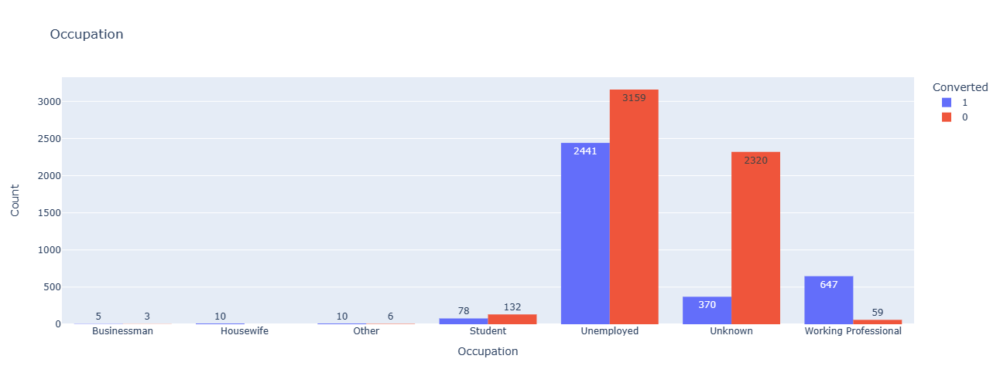

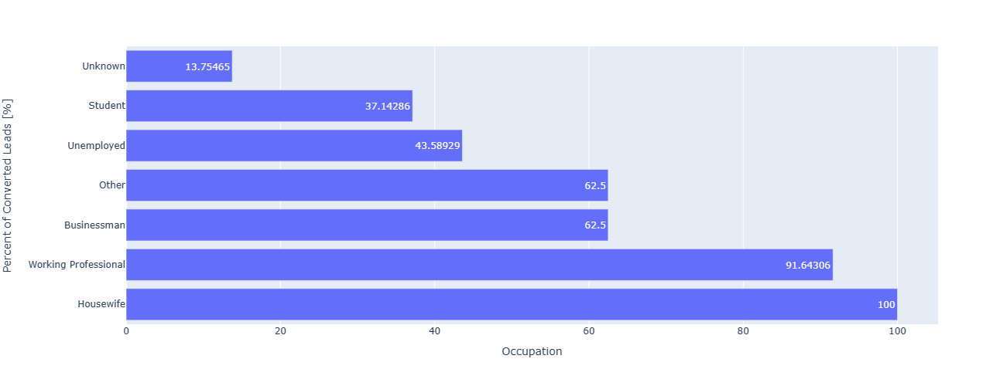

In [64]:
univariate_categorical("Occupation")

- Though Housewives are less in numbers, they have 100% conversion rate
- Working professionals, Businessmen and Other category have high conversion rate
- Though Unemployed people have been contacted in the highest number, the conversion rate is low (~40%)

We cannot combine smalled value categories as their conversion rate is very different. Combing them may provide wrong predictions.

### 4.3.7 Search, Newspaper Article, X Education Forums, Newspaper, Digital Advertisement, Through Recommendations, City, A free copy of Mastering The Interview

In [65]:
def pieplot(col):
    my_circle=plt.Circle( (0,0), 0.7, color='white')
    converted = lead_data[col].value_counts().rename_axis('unique_values').to_frame('counts')
    plt.pie(converted.counts, labels = ["No","Yes"],colors = ['red','green'],autopct='%1.1f%%')
    p=plt.gcf()
    p.gca().add_artist(my_circle)
    plt.title(col)

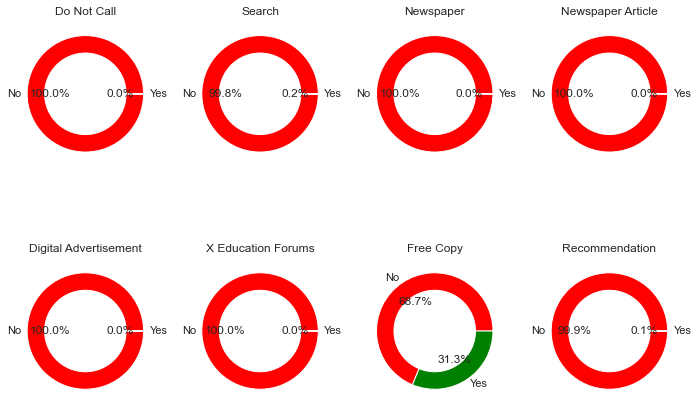

In [66]:
# Lets lookinto the data distribution of the following columns
col = ['Do Not Call','Search', 'Newspaper', 'Newspaper Article', 'Digital Advertisement', 'X Education Forums', 'Free Copy','Recommendation']
plt.figure(figsize = (12,8))
i=1
for each_col in col:
    plt.subplot(2,4,i)
    pieplot(each_col)
    i+=1

  Free Copy  Total Leads   % Values
0        No         6352  68.744589
1       Yes         2888  31.255411 



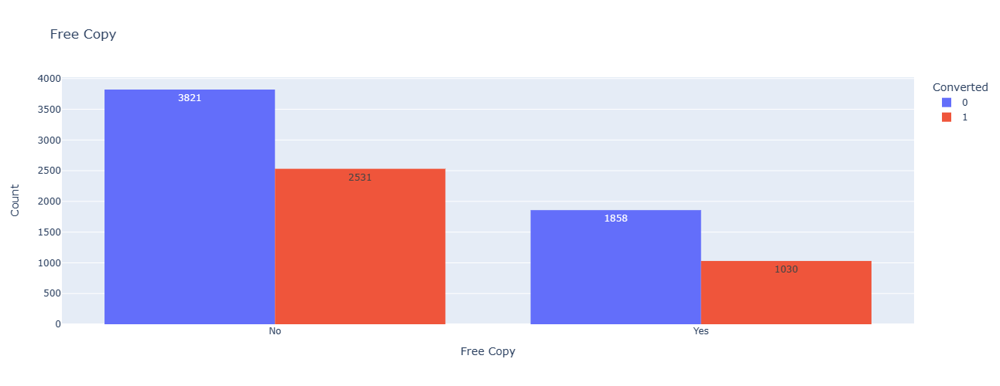

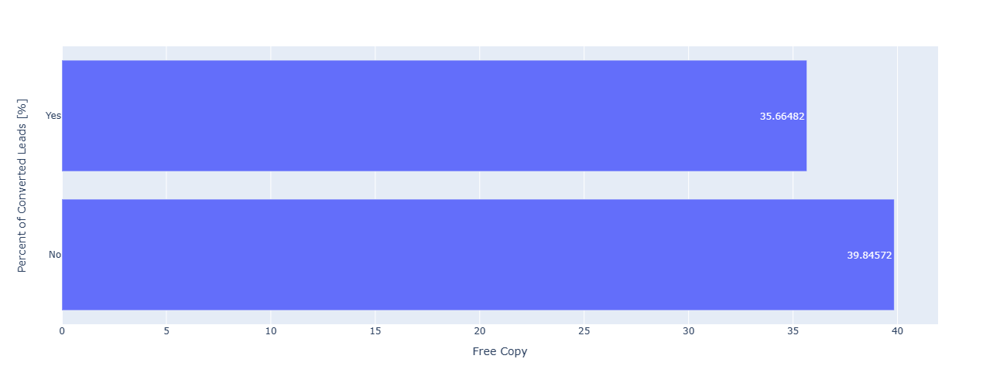

In [67]:
univariate_categorical("Free Copy")

- Search, Newspaper, Newspaper Article, Digital Advertisement, ,X Education Forums, Recommendation data are very skewed and can be deleted as they will not add any value to the model.
- Distributing Free-Copy of Mastering Interview doesn't seem to add much value as the coenversion rate is almost same. We will drop all these columns.

In [68]:
lead_data.drop(col,axis = 1, inplace = True)
len(lead_data.columns)

11

## 4.4 Univariate Analysis - Numerical

In [69]:
lead_data.columns

Index(['Lead Origin', 'Lead Source', 'Do Not Email', 'Converted',
       'TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit',
       'Last Activity', 'Specialization', 'Occupation', 'City'],
      dtype='object')

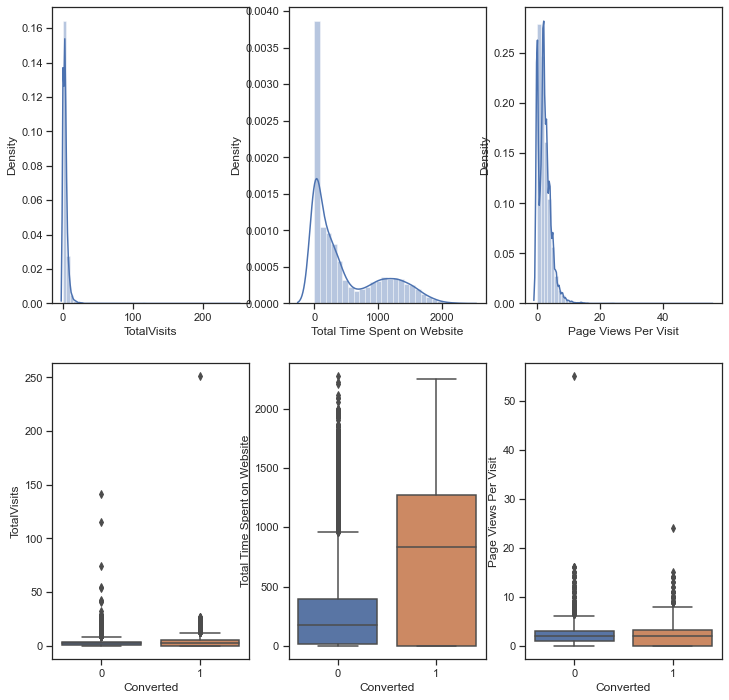

In [70]:
numerical_cols = ['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']
plt.figure(figsize=(12,12))

i=1
for col in numerical_cols:
    plt.subplot(2,3,i)
    sns.distplot(lead_data[col])
    plt.subplot(2,3,3+i)
    sns.boxplot(y=lead_data[col], x = lead_data['Converted'])
    i+=1

- TotalVisits and Page Views per Visit has some outliers which needs to be treated.

## 4.5 Bi-Variate Analysis

<Figure size 1440x1440 with 0 Axes>

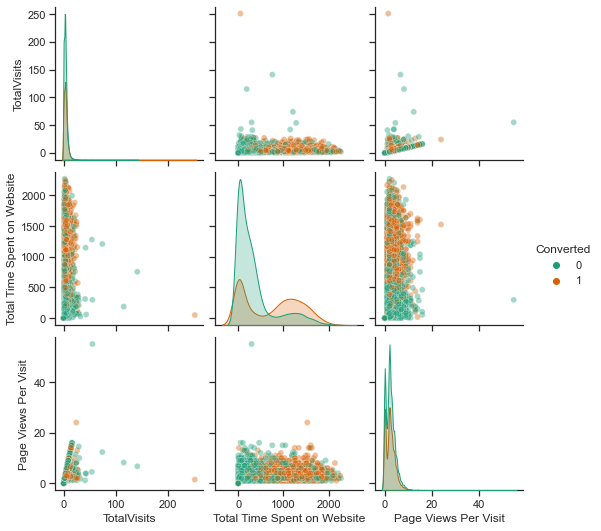

In [71]:
plt.figure(figsize =(20,20))
sns.pairplot(lead_data[numerical_features],hue="Converted",kind='scatter', plot_kws={'alpha':0.4},palette = 'Dark2')                                  
plt.show()

# 5. Data Preparation

- Outliers Treatment
- Convert Binary Categories
- Dummy Variables
- Train Test Split
- Feature Scaling

## 5.1 Outliers Treatment

In [72]:
numerical_cols

['TotalVisits', 'Total Time Spent on Website', 'Page Views Per Visit']

In [73]:
lead_data[numerical_cols].describe([.1,.5,.25,.75,.90,.95,.99])

,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000
mean,3.438636,487.698268,2.357440
std,4.819024,548.021466,2.145781
min,0.000000,0.000000,0.000000
10%,0.000000,0.000000,0.000000
25%,1.000000,12.000000,1.000000
50%,3.000000,248.000000,2.000000
75%,5.000000,936.000000,3.000000
90%,7.000000,1380.000000,5.000000
95%,10.000000,1562.000000,6.000000


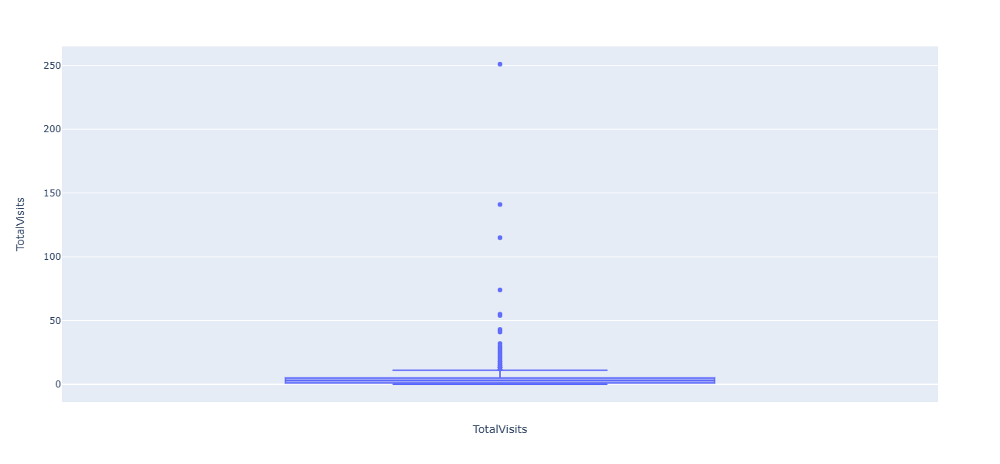

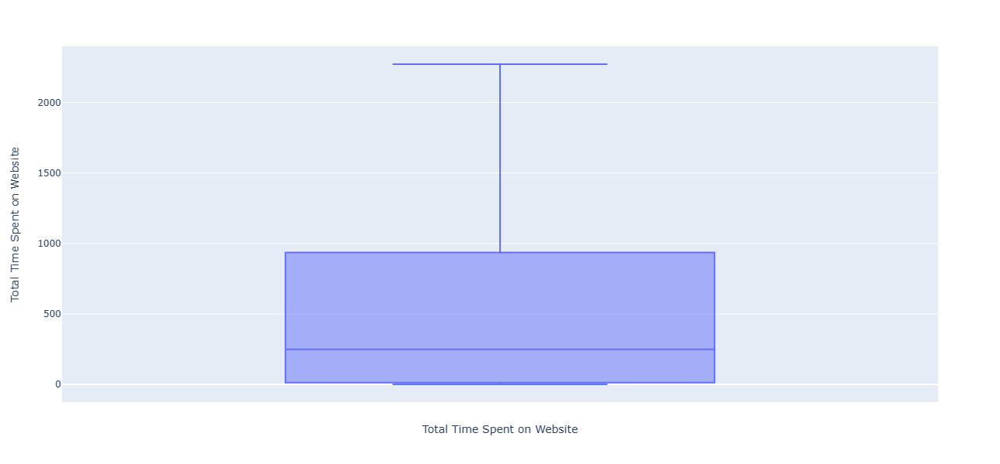

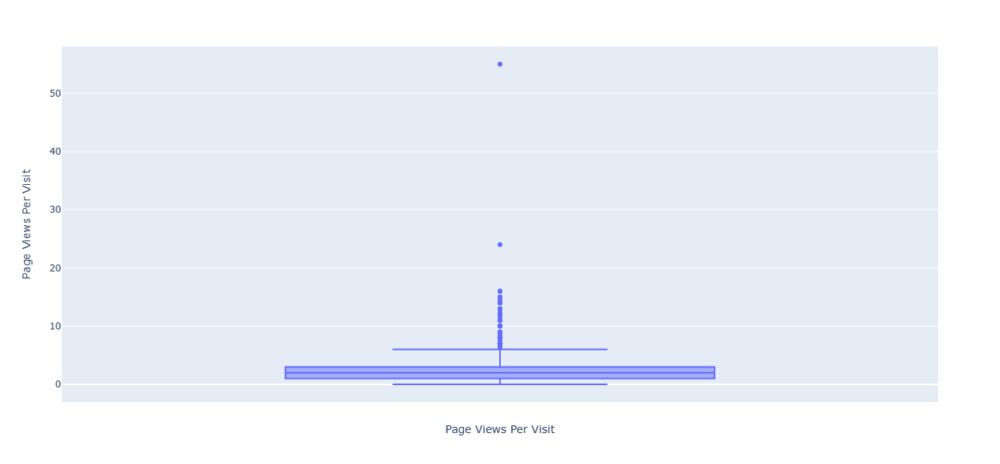

In [74]:
for col in numerical_cols:
    fig = px.box(lead_data, y=col, height=600, width=300)
    fig.update_layout(xaxis_title=col)

    fig.show()

Though outliers in TotalVisits and Page Views Per Visit shows valid values, this will misclassify the outcomes and consequently create problems when making inferences with the wrong model. Logistic Regression is heavily influenced by outliers. So lets cap the TotalVisits and Page Views Per Visit to their 95 th percentile due to following reasons:
- Data set is fairly high number
- 95th percentile and 99th percentile of these columns are very close and hence impact of capping to 95th or 99th percentile will be the same

In [75]:
#Capping the data at 95% percetile value
Q4 = lead_data['TotalVisits'].quantile(0.95) # Get 95th quantile
print("Total number of rows getting capped for TotalVisits column : ",len(lead_data[lead_data['TotalVisits'] >= Q4]))
lead_data.loc[lead_data['TotalVisits'] >= Q4, 'TotalVisits'] = Q4 # outlier capping

Q4 = lead_data['Page Views Per Visit'].quantile(0.95) # Get 95th quantile
print("Total number of rows getting capped for Page Views Per Visit column : ",len(lead_data[lead_data['Page Views Per Visit'] >= Q4]))
lead_data.loc[lead_data['Page Views Per Visit'] >= Q4, 'Page Views Per Visit'] = Q4 # outlier capping

Total number of rows getting capped for TotalVisits column :  467
Total number of rows getting capped for Page Views Per Visit column :  604


The number of rows getting capped are quite high. This is also the reason that we are capping the data instead of deleting it.

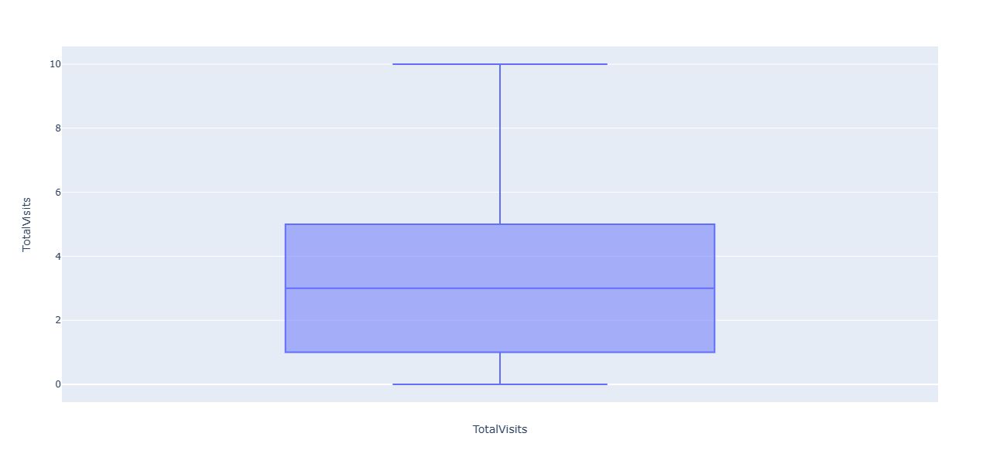

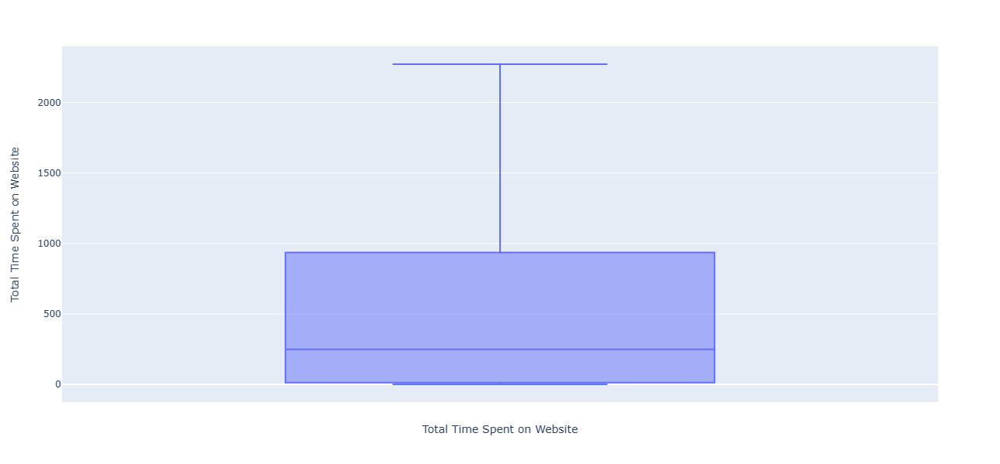

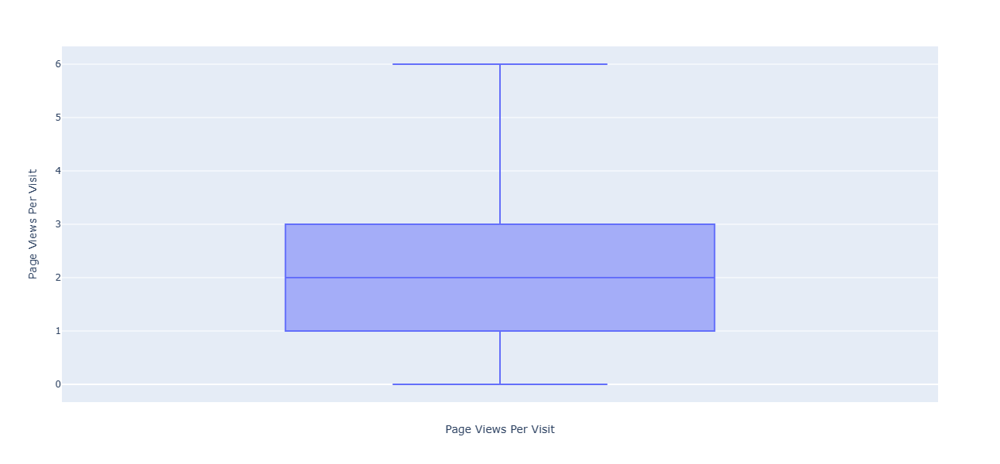

In [76]:
for col in numerical_cols:
    fig = px.box(lead_data, y=col, height=600, width=300)
    fig.update_layout(xaxis_title=col)

    fig.show()

Let's check the percentile values again

In [77]:
lead_data[numerical_cols].describe([.1,.5,.25,.75,.90,.95,.99])

,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000
mean,3.179221,487.698268,2.255105
std,2.761219,548.021466,1.779471
min,0.000000,0.000000,0.000000
10%,0.000000,0.000000,0.000000
25%,1.000000,12.000000,1.000000
50%,3.000000,248.000000,2.000000
75%,5.000000,936.000000,3.000000
90%,7.000000,1380.000000,5.000000
95%,10.000000,1562.000000,6.000000


## 5.2 Convert Binary Categories

In [78]:
cols = list(lead_data.columns)
number_of_unique_values(lead_data, cols)

,Features,Count_Unique_values,Unique_values,Missing_values_count,Data_type
0,Do Not Email,2,"[No, Yes]",0,object
1,Converted,2,"[0, 1]",0,int64
2,Lead Origin,5,"[API, Landing Page Submission, Lead Add Form, Lead Import, Quick Add Form]",0,object
3,Occupation,7,"[Unemployed, Student, Unknown, Working Professional, Businessman, Other, Housewife]",0,object
4,City,8,"[Select, Mumbai, nan, Thane & Outskirts, Other Metro Cities, Other Cities, Other Cities of Maharashtra, Tier II Cities]",1420,object
5,Lead Source,9,"[Olark Chat, Organic Search, Direct Traffic, Google, Referral Sites, Welingak Website, Reference, Facebook, Other Sources]",0,object
6,TotalVisits,11,"[0.0, 5.0, 2.0, 1.0, 4.0, 8.0, 10.0, 6.0, 3.0, 7.0, 9.0]",0,float64
7,Last Activity,12,"[Page Visited on Website, Email Opened, Unreachable, Converted to Lead, Olark Chat Conversation, Email Bounced, Email Link Clicked, Form Submitted on Website, Unsubscribed, Other Activity, nan, SMS Sent]",103,object
8,Specialization,20,"[Select, Business Administration, Media and Advertising, Unknown, Supply Chain Management, IT Projects Management, Finance Management, Travel and Tourism, Human Resource Management, Marketing Management, Banking, Investment And Insurance, International Business, E-COMMERCE, Operations Management, Retail Management, Services Excellence, Hospitality Management, Rural and Agribusiness, Healthcare Management, E-Business]",0,object
9,Page Views Per Visit,91,"[0.0, 2.5, 2.0, 1.0, 4.0, 6.0, 2.67, 5.0, 3.0, 1.33, 1.5, 3.5, 2.33, 5.5, 1.67, 4.5, 3.33, 1.71, 1.8, 4.33, 3.4, 1.25, 1.75, 2.63, 2.25, 3.67, 1.43, 2.6, 4.75, 1.27, 3.25, 5.33, 2.57, 2.17, 2.75, 2.8, 2.2, 2.86, 3.91, 1.4, 5.67, 3.2, 1.38, 2.09, 2.4, 5.25, 3.57, 2.22, 1.83, 3.6, 1.2, 1.57, 1.56, 5.4, 4.25, 1.31, 1.6, 2.9, 1.23, 1.78, 3.83, 1.14, 2.71, 1.45, 2.38, 1.86, 2.29, 1.21, 3.43, 2.56, 1.64, 4.4, 3.17, 1.48, 1.22, 3.75, 1.54, 2.13, 2.14, 2.45, 3.29, 4.17, 1.63, 3.38, 1.17, 3.8, 1.19, 3.82, 2.83, 1.93, 2.08]",0,float64


- We will convert Do Not Email column in to binary.

In [79]:
# Checking the categorical values for 'Do Not Email' feature
lead_data['Do Not Email'].value_counts()

No     8506
Yes     734
Name: Do Not Email, dtype: int64

In [80]:
# Defining the map function
def binary_map(x):
    return x.map({'Yes': 1, "No": 0})

# Applying the function to the lead YES/NO variable list
lead_data['Do Not Email'] = lead_data[['Do Not Email']].apply(binary_map)


In [81]:
# rechecking the categorical values for 'Do Not Email' feature
lead_data['Do Not Email'].value_counts()

0    8506
1     734
Name: Do Not Email, dtype: int64

## 5.3 Dummy Variables

In [82]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
dummy = pd.get_dummies(lead_data[['Lead Origin', 'Lead Source', 'Occupation', 'Last Activity', 'Specialization']], drop_first=True)

# Adding the results to the master dataframe
lead_data = pd.concat([lead_data, dummy], axis=1)

lead_data.head()

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,Occupation,City,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Occupation_Housewife,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Unknown,Occupation_Working Professional,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Select,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Specialization_Unknown
0,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Select,Unemployed,Select,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Select,Unemployed,Select,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Mumbai,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Mumbai,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Select,Unemployed,Mumbai,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [83]:
# We have created dummies for the below variables, so we can drop them
lead_data = lead_data.drop(['Lead Origin', 'Lead Source', 'Occupation', 'Last Activity', 'Specialization', 'City'], axis=1)
lead_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 52 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Do Not Email                              9240 non-null   int64  
 1   Converted                                 9240 non-null   int64  
 2   TotalVisits                               9240 non-null   float64
 3   Total Time Spent on Website               9240 non-null   int64  
 4   Page Views Per Visit                      9240 non-null   float64
 5   Lead Origin_Landing Page Submission       9240 non-null   uint8  
 6   Lead Origin_Lead Add Form                 9240 non-null   uint8  
 7   Lead Origin_Lead Import                   9240 non-null   uint8  
 8   Lead Origin_Quick Add Form                9240 non-null   uint8  
 9   Lead Source_Facebook                      9240 non-null   uint8  
 10  Lead Source_Google                  

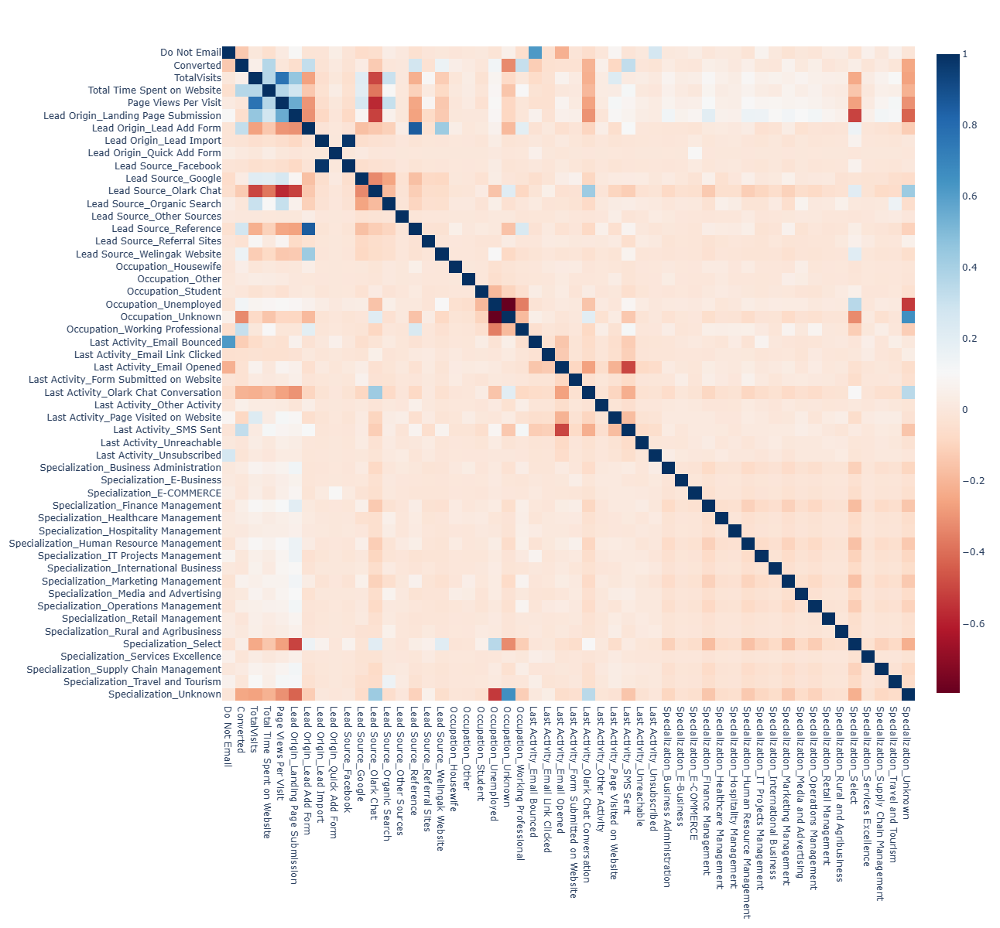

In [84]:
fig = px.imshow(lead_data.corr(), aspect='auto', width= 1200, height=1200, color_continuous_scale='RdBu')
fig.show()

In [85]:
print('Total number of columns after Encoding : ',len(lead_data.columns))

Total number of columns after Encoding :  52


In [86]:
corr_lead = lead_data.corr()
corr_lead = corr_lead.where(np.triu(np.ones(corr_lead.shape),k=1).astype(np.bool))
corr_df = corr_lead.unstack().reset_index()
corr_df.columns =['VAR1','VAR2','Correlation']
corr_df.dropna(subset = ["Correlation"], inplace = True) 
corr_df.sort_values(by='Correlation', ascending=False, inplace=True)

# Top 5 Positive correlated variables
corr_df.head(5)

,VAR1,VAR2,Correlation
475,Lead Source_Facebook,Lead Origin_Lead Import,0.981709
734,Lead Source_Reference,Lead Origin_Lead Add Form,0.853237
210,Page Views Per Visit,TotalVisits,0.767585
2673,Specialization_Unknown,Occupation_Unknown,0.658088
1196,Last Activity_Email Bounced,Do Not Email,0.618470


In [87]:
corr_df.sort_values(by='Correlation', ascending=True, inplace=True)

# Top 5 Negatively correlated variables
corr_df.head(5)

,VAR1,VAR2,Correlation
1112,Occupation_Unknown,Occupation_Unemployed,-0.794875
576,Lead Source_Olark Chat,Page Views Per Visit,-0.573334
2672,Specialization_Unknown,Occupation_Unemployed,-0.532500
577,Lead Source_Olark Chat,Lead Origin_Landing Page Submission,-0.512950
2449,Specialization_Select,Lead Origin_Landing Page Submission,-0.507078


## 5.4 Train Test Split

In [88]:
# target variable
Y = lead_data['Converted']
X = lead_data.drop(['Converted'], axis=1)

# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=100)

In [89]:
#Checking the shape of the created Train & Test DFs
print(" Shape of X_train is : ",X_train.shape)
print(" Shape of y_train is : ",y_train.shape)
print(" Shape of X_test is  : ",X_test.shape)
print(" Shape of y_test is  : ",y_test.shape)

 Shape of X_train is :  (6468, 51)
 Shape of y_train is :  (6468,)
 Shape of X_test is  :  (2772, 51)
 Shape of y_test is  :  (2772,)


## 5.5 Feature Scaling

In [90]:
scaler = StandardScaler()

X_train[['Total Time Spent on Website','Page Views Per Visit','TotalVisits']] = scaler.fit_transform(X_train[['Total Time Spent on Website','Page Views Per Visit','TotalVisits']])
X_train.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Occupation_Housewife,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Unknown,Occupation_Working Professional,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Select,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Specialization_Unknown
1871,0,-1.149699,-0.885371,-1.266675,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
6795,0,0.299722,0.005716,-0.516439,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3516,0,0.662077,-0.691418,0.143543,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
8105,0,0.662077,1.365219,1.553761,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3934,0,-1.149699,-0.885371,-1.266675,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


# 6. Model Building

- RFE for Feature Reduction
- Mannual Feature Reduction

## 6.1 RFE for Feature Reduction

In [91]:
# Using RFE to reduce the feature count 
lr = LogisticRegression()
rfe = RFE(lr, n_features_to_select = 20)
rfe = rfe.fit(X_train, y_train)

In [92]:
#checking the output of RFE
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('TotalVisits', False, 8),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 9),
 ('Lead Origin_Landing Page Submission', True, 1),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 30),
 ('Lead Origin_Quick Add Form', False, 17),
 ('Lead Source_Facebook', False, 21),
 ('Lead Source_Google', False, 11),
 ('Lead Source_Olark Chat', True, 1),
 ('Lead Source_Organic Search', False, 19),
 ('Lead Source_Other Sources', False, 6),
 ('Lead Source_Reference', False, 7),
 ('Lead Source_Referral Sites', False, 20),
 ('Lead Source_Welingak Website', True, 1),
 ('Occupation_Housewife', True, 1),
 ('Occupation_Other', True, 1),
 ('Occupation_Student', False, 3),
 ('Occupation_Unemployed', False, 2),
 ('Occupation_Unknown', True, 1),
 ('Occupation_Working Professional', True, 1),
 ('Last Activity_Email Bounced', False, 31),
 ('Last Activity_Email Link Clicked', False, 10),
 ('Last Activity_Email Opened', True, 1),
 ('L

In [93]:
#checking which columns remained after RFE
rfe_col = X_train.columns[rfe.support_]
rfe_col

Index(['Do Not Email', 'Total Time Spent on Website',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Olark Chat', 'Lead Source_Welingak Website',
       'Occupation_Housewife', 'Occupation_Other', 'Occupation_Unknown',
       'Occupation_Working Professional', 'Last Activity_Email Opened',
       'Last Activity_Olark Chat Conversation', 'Last Activity_Other Activity',
       'Last Activity_SMS Sent', 'Last Activity_Unreachable',
       'Last Activity_Unsubscribed', 'Specialization_Hospitality Management',
       'Specialization_Rural and Agribusiness', 'Specialization_Select',
       'Specialization_Unknown'],
      dtype='object')

In [94]:
#Columns which have been removed after RFE
X_train.columns[~rfe.support_]


Index(['TotalVisits', 'Page Views Per Visit', 'Lead Origin_Lead Import',
       'Lead Origin_Quick Add Form', 'Lead Source_Facebook',
       'Lead Source_Google', 'Lead Source_Organic Search',
       'Lead Source_Other Sources', 'Lead Source_Reference',
       'Lead Source_Referral Sites', 'Occupation_Student',
       'Occupation_Unemployed', 'Last Activity_Email Bounced',
       'Last Activity_Email Link Clicked',
       'Last Activity_Form Submitted on Website',
       'Last Activity_Page Visited on Website',
       'Specialization_Business Administration', 'Specialization_E-Business',
       'Specialization_E-COMMERCE', 'Specialization_Finance Management',
       'Specialization_Healthcare Management',
       'Specialization_Human Resource Management',
       'Specialization_IT Projects Management',
       'Specialization_International Business',
       'Specialization_Marketing Management',
       'Specialization_Media and Advertising',
       'Specialization_Operations Management'

In [95]:
# Functions to repeat Logictis regression model and VIF calculation repeatedly

# function to build logistic regression model
def build_logistic_model(feature_list):
    X_train_local = X_train[feature_list] # get feature list for VIF
    X_train_sm = sm.add_constant(X_train_local) # required by statsmodels   
    log_model = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial()).fit() # build model and learn coefficients  
    return(log_model, X_train_sm) # return the model and the X_train fitted with constant 

#function to calculate VIF
def calculate_VIF(X_train):  # Calculate VIF for features
    vif = pd.DataFrame()
    vif['Features'] = X_train.columns # Read the feature names
    vif['VIF'] = [variance_inflation_factor(X_train.values,i) for i in range(X_train.shape[1])] # calculate VIF
    vif['VIF'] = round(vif['VIF'],2)
    vif.sort_values(by='VIF', ascending = False, inplace=True)  
    return(vif) # returns the calculated VIFs for all the features

## 6.2 Mannual Feature Reduction

- Model 1
- Model 2 
- Model 3
- Model 4 
- Model 5

### 6.2.1 Model 1

In [96]:
features = list(rfe_col) #  Use RFE selected variables
log_model1, X_train_sm1 = build_logistic_model(features) # Call the function and get the model and the X_train_sm for prediction
log_model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6447
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2596.6
Date:                Sun, 26 Feb 2023   Deviance:                       5193.2
Time:                        22:51:24   Pearson chi2:                 7.89e+03
No. Iterations:                    21   Pseudo R-squ. (CS):             0.4093
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                    -0.8519      0.149     -5.708      0.000      -1.144      -0.559
Do Not Email                             -1.1632      0.183     -6.369      0.000      -1.521      -0.805
Total Time Spent on Website               1.0699      0.040     26.782      0.000       0.992       1.148
Lead Origin_Landing Page Submission      -1.0444      0.129     -8.108      0.000      -1.297      -0.792
Lead Origin_Lead Add Form                 2.8294      0.203     13.933      0.000       2.431       3.227
Lead Source_Olark Chat                    1.0980      0.123      8.892      0.000       0.856       1.340
Lead Source_Welingak Website              2.4502      0.749      3.270      0.001       0.982       3.919
Occupation_Housewife                     22.8070   1.37e+04      0.002      0.999   -2.68e+04    2.68e+04
Occupation_Other                         -0.1753      0.806     -0.218      0.828      -1.754       1.404
Occupation_Unknown                       -0.9776      0.113     -8.614      0.000      -1.200      -0.755
Occupation_Working Professional           2.4245      0.190     12.729      0.000       2.051       2.798
Last Activity_Email Opened                0.7899      0.110      7.212      0.000       0.575       1.005
Last Activity_Olark Chat Conversation    -0.5498      0.192     -2.868      0.004      -0.926      -0.174
Last Activity_Other Activity              2.3187      0.489      4.741      0.000       1.360       3.277
Last Activity_SMS Sent                    1.9151      0.111     17.234      0.000       1.697       2.133
Last Activity_Unreachable                 0.9046      0.368      2.458      0.014       0.183       1.626
Last Activity_Unsubscribed                1.4028      0.485      2.891      0.004       0.452       2.354
Specialization_Hospitality Management    -0.9912      0.327     -3.030      0.002      -1.632      -0.350
Specialization_Rural and Agribusiness     0.5396      0.390      1.385      0.166      -0.224       1.303
Specialization_Select                    -0.9193      0.129     -7.153      0.000      -1.171      -0.667
Specialization_Unknown                   -1.1627      0.187     -6.211      0.000      -1.530      -0.796
=========================================================================================================
"""

In [97]:
#Checking VIF values
calculate_VIF(X_train)

,Features,VIF
19,Occupation_Unemployed,36.60
20,Occupation_Unknown,19.95
5,Lead Origin_Lead Add Form,17.14
6,Lead Origin_Lead Import,16.89
8,Lead Source_Facebook,16.87
13,Lead Source_Reference,14.08
46,Specialization_Select,8.52
4,Lead Origin_Landing Page Submission,8.51
50,Specialization_Unknown,8.11
24,Last Activity_Email Opened,7.81


### 6.2.2 Model 2

We will remove 'Occupation_Housewife' feature due to high P-value of 0.999

In [98]:
features.remove('Occupation_Housewife') # Remove 'Occupation_Housewife number' from RFE features list
log_model2, X_train_sm2 = build_logistic_model(features) # Call the function and get the model and the X_train_sm for prediction
log_model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6448
Model Family:                Binomial   Df Model:                           19
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2603.3
Date:                Sun, 26 Feb 2023   Deviance:                       5206.5
Time:                        22:51:26   Pearson chi2:                 7.91e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.4081
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                    -0.8417      0.149     -5.651      0.000      -1.134      -0.550
Do Not Email                             -1.1692      0.183     -6.403      0.000      -1.527      -0.811
Total Time Spent on Website               1.0688      0.040     26.785      0.000       0.991       1.147
Lead Origin_Landing Page Submission      -1.0396      0.129     -8.076      0.000      -1.292      -0.787
Lead Origin_Lead Add Form                 2.8469      0.203     14.034      0.000       2.449       3.245
Lead Source_Olark Chat                    1.0971      0.123      8.889      0.000       0.855       1.339
Lead Source_Welingak Website              2.4331      0.749      3.248      0.001       0.965       3.902
Occupation_Other                         -0.1844      0.805     -0.229      0.819      -1.763       1.394
Occupation_Unknown                       -0.9856      0.113     -8.691      0.000      -1.208      -0.763
Occupation_Working Professional           2.4150      0.190     12.685      0.000       2.042       2.788
Last Activity_Email Opened                0.7875      0.109      7.213      0.000       0.574       1.001
Last Activity_Olark Chat Conversation    -0.5555      0.192     -2.900      0.004      -0.931      -0.180
Last Activity_Other Activity              2.3081      0.489      4.720      0.000       1.350       3.267
Last Activity_SMS Sent                    1.9050      0.111     17.189      0.000       1.688       2.122
Last Activity_Unreachable                 0.8932      0.368      2.427      0.015       0.172       1.615
Last Activity_Unsubscribed                1.3982      0.485      2.881      0.004       0.447       2.349
Specialization_Hospitality Management    -0.9983      0.327     -3.051      0.002      -1.640      -0.357
Specialization_Rural and Agribusiness     0.5311      0.389      1.364      0.173      -0.232       1.294
Specialization_Select                    -0.9253      0.128     -7.204      0.000      -1.177      -0.674
Specialization_Unknown                   -1.1593      0.187     -6.197      0.000      -1.526      -0.793
=========================================================================================================
"""

In [99]:
#Checking VIF Values
calculate_VIF(X_train[features])

,Features,VIF
18,Specialization_Unknown,3.11
2,Lead Origin_Landing Page Submission,3.00
7,Occupation_Unknown,2.80
9,Last Activity_Email Opened,2.41
12,Last Activity_SMS Sent,2.20
4,Lead Source_Olark Chat,2.18
17,Specialization_Select,1.80
10,Last Activity_Olark Chat Conversation,1.76
3,Lead Origin_Lead Add Form,1.56
5,Lead Source_Welingak Website,1.27


### 6.2.3 Model 3

We will remove 'Occupation Other' feature due to high P-value of 0.819

In [100]:
features.remove('Occupation_Other')
log_model3, X_train_sm3 = build_logistic_model(features) # Call the function and get the model and the X_train_sm for prediction
log_model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6449
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2603.3
Date:                Sun, 26 Feb 2023   Deviance:                       5206.6
Time:                        22:51:27   Pearson chi2:                 7.91e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.4081
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                    -0.8431      0.149     -5.664      0.000      -1.135      -0.551
Do Not Email                             -1.1701      0.183     -6.409      0.000      -1.528      -0.812
Total Time Spent on Website               1.0686      0.040     26.792      0.000       0.990       1.147
Lead Origin_Landing Page Submission      -1.0391      0.129     -8.073      0.000      -1.291      -0.787
Lead Origin_Lead Add Form                 2.8474      0.203     14.037      0.000       2.450       3.245
Lead Source_Olark Chat                    1.0974      0.123      8.891      0.000       0.855       1.339
Lead Source_Welingak Website              2.4329      0.749      3.247      0.001       0.964       3.901
Occupation_Unknown                       -0.9849      0.113     -8.688      0.000      -1.207      -0.763
Occupation_Working Professional           2.4157      0.190     12.690      0.000       2.043       2.789
Last Activity_Email Opened                0.7877      0.109      7.216      0.000       0.574       1.002
Last Activity_Olark Chat Conversation    -0.5563      0.192     -2.904      0.004      -0.932      -0.181
Last Activity_Other Activity              2.3088      0.489      4.721      0.000       1.350       3.267
Last Activity_SMS Sent                    1.9057      0.111     17.200      0.000       1.689       2.123
Last Activity_Unreachable                 0.8940      0.368      2.429      0.015       0.173       1.615
Last Activity_Unsubscribed                1.3996      0.485      2.884      0.004       0.448       2.351
Specialization_Hospitality Management    -0.9977      0.327     -3.049      0.002      -1.639      -0.356
Specialization_Rural and Agribusiness     0.5317      0.389      1.366      0.172      -0.231       1.295
Specialization_Select                    -0.9246      0.128     -7.201      0.000      -1.176      -0.673
Specialization_Unknown                   -1.1590      0.187     -6.196      0.000      -1.526      -0.792
=========================================================================================================
"""

In [101]:
#Checking VIF Values
calculate_VIF(X_train[features])

,Features,VIF
17,Specialization_Unknown,3.11
2,Lead Origin_Landing Page Submission,3.00
6,Occupation_Unknown,2.80
8,Last Activity_Email Opened,2.41
11,Last Activity_SMS Sent,2.20
4,Lead Source_Olark Chat,2.18
16,Specialization_Select,1.80
9,Last Activity_Olark Chat Conversation,1.76
3,Lead Origin_Lead Add Form,1.56
5,Lead Source_Welingak Website,1.27


### 6.2.4 Model 4

We will remove 'Specialization_Rural and Agribusiness' feature due to high P-Value of 0.172

In [102]:
features.remove('Specialization_Rural and Agribusiness')
log_model4, X_train_sm4 = build_logistic_model(features) # Call the function and get the model and the X_train_sm for prediction
log_model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6450
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2604.2
Date:                Sun, 26 Feb 2023   Deviance:                       5208.4
Time:                        22:51:27   Pearson chi2:                 7.92e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.4079
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                    -0.8346      0.149     -5.615      0.000      -1.126      -0.543
Do Not Email                             -1.1681      0.182     -6.406      0.000      -1.526      -0.811
Total Time Spent on Website               1.0681      0.040     26.787      0.000       0.990       1.146
Lead Origin_Landing Page Submission      -1.0390      0.129     -8.077      0.000      -1.291      -0.787
Lead Origin_Lead Add Form                 2.8459      0.203     14.033      0.000       2.448       3.243
Lead Source_Olark Chat                    1.0988      0.123      8.905      0.000       0.857       1.341
Lead Source_Welingak Website              2.4336      0.749      3.248      0.001       0.965       3.902
Occupation_Unknown                       -0.9866      0.113     -8.707      0.000      -1.209      -0.765
Occupation_Working Professional           2.4145      0.190     12.684      0.000       2.041       2.788
Last Activity_Email Opened                0.7866      0.109      7.210      0.000       0.573       1.000
Last Activity_Olark Chat Conversation    -0.5602      0.191     -2.925      0.003      -0.935      -0.185
Last Activity_Other Activity              2.3025      0.489      4.709      0.000       1.344       3.261
Last Activity_SMS Sent                    1.9026      0.111     17.190      0.000       1.686       2.120
Last Activity_Unreachable                 0.8869      0.368      2.410      0.016       0.166       1.608
Last Activity_Unsubscribed                1.4158      0.487      2.908      0.004       0.462       2.370
Specialization_Hospitality Management    -1.0039      0.327     -3.069      0.002      -1.645      -0.363
Specialization_Select                    -0.9318      0.128     -7.266      0.000      -1.183      -0.680
Specialization_Unknown                   -1.1648      0.187     -6.231      0.000      -1.531      -0.798
=========================================================================================================
"""

In [103]:
#Checking VIF Values
calculate_VIF(X_train[features])

,Features,VIF
16,Specialization_Unknown,3.11
2,Lead Origin_Landing Page Submission,2.99
6,Occupation_Unknown,2.80
8,Last Activity_Email Opened,2.41
11,Last Activity_SMS Sent,2.20
4,Lead Source_Olark Chat,2.18
15,Specialization_Select,1.80
9,Last Activity_Olark Chat Conversation,1.76
3,Lead Origin_Lead Add Form,1.56
5,Lead Source_Welingak Website,1.27


### 6.2.5 Model 5

We will remove 'Specialization_Unknown' which is having VIF more than 3

In [104]:
features.remove('Specialization_Unknown')
log_model5, X_train_sm5 = build_logistic_model(features) # Call the function and get the model and the X_train_sm for prediction
log_model5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6468
Model:                            GLM   Df Residuals:                     6451
Model Family:                Binomial   Df Model:                           16
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2624.0
Date:                Sun, 26 Feb 2023   Deviance:                       5248.1
Time:                        22:51:28   Pearson chi2:                 7.68e+03
No. Iterations:                     7   Pseudo R-squ. (CS):             0.4043
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                    -1.1882      0.137     -8.668      0.000      -1.457      -0.919
Do Not Email                             -1.1824      0.182     -6.504      0.000      -1.539      -0.826
Total Time Spent on Website               1.0841      0.040     27.132      0.000       1.006       1.162
Lead Origin_Landing Page Submission      -0.6335      0.110     -5.785      0.000      -0.848      -0.419
Lead Origin_Lead Add Form                 3.0437      0.200     15.206      0.000       2.651       3.436
Lead Source_Olark Chat                    1.0667      0.121      8.840      0.000       0.830       1.303
Lead Source_Welingak Website              2.2703      0.749      3.032      0.002       0.803       3.738
Occupation_Unknown                       -1.3953      0.098    -14.180      0.000      -1.588      -1.202
Occupation_Working Professional           2.4272      0.189     12.873      0.000       2.058       2.797
Last Activity_Email Opened                0.7962      0.109      7.334      0.000       0.583       1.009
Last Activity_Olark Chat Conversation    -0.6008      0.188     -3.195      0.001      -0.969      -0.232
Last Activity_Other Activity              2.2376      0.490      4.564      0.000       1.277       3.199
Last Activity_SMS Sent                    1.8997      0.110     17.226      0.000       1.684       2.116
Last Activity_Unreachable                 0.9156      0.368      2.489      0.013       0.195       1.637
Last Activity_Unsubscribed                1.4186      0.481      2.949      0.003       0.476       2.362
Specialization_Hospitality Management    -0.9192      0.328     -2.802      0.005      -1.562      -0.276
Specialization_Select                    -0.5874      0.115     -5.127      0.000      -0.812      -0.363
=========================================================================================================
"""

In [105]:
#Checking VIF Values
calculate_VIF(X_train[features])

,Features,VIF
2,Lead Origin_Landing Page Submission,2.56
8,Last Activity_Email Opened,2.30
11,Last Activity_SMS Sent,2.10
4,Lead Source_Olark Chat,2.07
15,Specialization_Select,1.67
6,Occupation_Unknown,1.66
9,Last Activity_Olark Chat Conversation,1.65
3,Lead Origin_Lead Add Form,1.56
5,Lead Source_Welingak Website,1.27
0,Do Not Email,1.26


Inferences:
    
- We have a stable model as Model No. 5 where all P-values of features are significant and VIF values are below 3, signifiying that there is negligible multi-colinearity. Most of the feature coefficients are positive. We will select Model 5 as our final model and evaluate the model on Train and Test Data Set.

# 7. Model Evaluation : Train Dataset

In [106]:
# Create a matrix to Print the Accuracy, Sensitivity and Specificity
def lg_metrics(confusion_matrix):
    TN =confusion_matrix[0,0]
    TP =confusion_matrix[1,1]
    FP =confusion_matrix[0,1]
    FN =confusion_matrix[1,0]
    accuracy = (TP+TN)/(TP+TN+FP+FN)
    speci = TN/(TN+FP)
    sensi = TP/(TP+FN)
    precision = TP/(TP+FP)
    recall = TP/(TP+FN)
    TPR = TP/(TP + FN)
    TNR = TN/(TN + FP)
    FPR = FP/(TN + FP)
    FNR = FN/(TP + FN)
    pos_pred_val = TP /(TP+FP)
    neg_pred_val = TN /(TN+FN)
    
    print ("Model Accuracy value is              : ", round(accuracy*100,2),"%")
    print ("Model Sensitivity value is           : ", round(sensi*100,2),"%")
    print ("Model Specificity value is           : ", round(speci*100,2),"%")
    print ("Model Precision value is             : ", round(precision*100,2),"%")
    print ("Model Recall value is                : ", round(recall*100,2),"%")
    print ("Model True Positive Rate (TPR)       : ", round(TPR*100,2),"%")
    print ("Model False Positive Rate (FPR)      : ", round(FPR*100,2),"%")
    print ("Model Poitive Prediction Value is    : ", round(pos_pred_val*100,2),"%")
    print ("Model Negative Prediction value is   : ", round(neg_pred_val*100,2),"%")

## 7.1 Predict Probability Calculation

In [107]:
# Getting the predicted values on the train set
y_train_pred =log_model5.predict( X_train_sm5)
y_train_pred[:10]

1871    0.429203
6795    0.167046
3516    0.340234
8105    0.826066
3934    0.294733
4844    0.989278
3297    0.139832
8071    0.998048
987     0.127124
7423    0.905904
dtype: float64

In [108]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.42920307, 0.16704636, 0.34023402, 0.82606637, 0.29473296,
       0.98927818, 0.13983196, 0.99804789, 0.12712398, 0.90590427])

In [109]:
#Creating a dataframe with the actual Converted flag and the Predicted probabilities
y_train_pred_final = pd.DataFrame({'Converted_Value':y_train.values, 'Converted_Prob':y_train_pred})
# y_train_pred_final['Prospect_IND'] = y_train.index
y_train_pred_final.head()

,Converted_Value,Converted_Prob
0,0,0.429203
1,0,0.167046
2,0,0.340234
3,0,0.826066
4,0,0.294733


In [110]:
#Finding Optimal Cutoff Point
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > i else 0)
# y_train_pred_final

In [111]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci','Precision','Recall'])
from sklearn.metrics import confusion_matrix

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final['Converted_Value'], y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    prec, rec, thresholds = precision_recall_curve(y_train_pred_final['Converted_Value'], y_train_pred_final[i])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci, prec[1], rec[1]]
cutoff_df

,prob,accuracy,sensi,speci,Precision,Recall
0.0,0.0,0.381262,1.000000,0.000000,1.000000,0.000000
0.1,0.1,0.632344,0.972830,0.422539,0.509342,0.972830
0.2,0.2,0.761441,0.914031,0.667416,0.628731,0.914031
0.3,0.3,0.800711,0.845904,0.772864,0.696494,0.845904
0.4,0.4,0.817718,0.774939,0.844078,0.753846,0.774939
0.5,0.5,0.816327,0.697891,0.889305,0.795287,0.697891
0.6,0.6,0.804113,0.612328,0.922289,0.829215,0.612328
0.7,0.7,0.784477,0.526358,0.943528,0.851706,0.526358
0.8,0.8,0.765306,0.432685,0.970265,0.899663,0.432685
0.9,0.9,0.717842,0.280616,0.987256,0.931359,0.280616


<Figure size 1296x576 with 0 Axes>

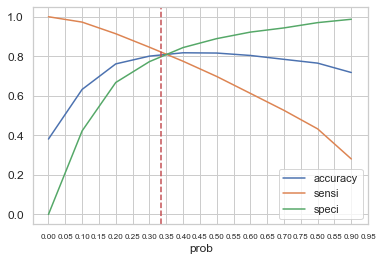

In [112]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
plt.figure(figsize=(18,8))
sns.set_style("whitegrid")
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.xticks(np.arange(0,1,step=0.05),size=8)
plt.axvline(x=0.335, color='r', linestyle='--') # additing axline
plt.yticks(size=12)
plt.show()

From the above graph, 0.335 seems to be ideal cut-off points

In [113]:
y_train_pred_final['final_predicted_1'] = y_train_pred_final['Converted_Prob'].map( lambda x: 1 if x > 0.335 else 0)
y_train_pred_final.drop([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],axis = 1, inplace = True) # deleting the unnecessary columns
y_train_pred_final.head()

,Converted_Value,Converted_Prob,final_predicted_1
0,0,0.429203,1
1,0,0.167046,0
2,0,0.340234,1
3,0,0.826066,1
4,0,0.294733,0


In [114]:
# Let's assign Lead_score for the leads in Train Data Set
y_train_pred_final['lead_score_1']=(y_train_pred_final['Converted_Prob']*100).astype("int64")
y_train_pred_final.sort_values(by='Converted_Prob',ascending=False)

,Converted_Value,Converted_Prob,final_predicted_1,lead_score_1
4891,1,0.999453,1,99
1229,0,0.999062,1,99
2888,1,0.998869,1,99
3115,1,0.998815,1,99
5114,1,0.998688,1,99
7,1,0.998048,1,99
6312,1,0.997961,1,99
2321,1,0.997673,1,99
6187,1,0.997563,1,99
871,1,0.997279,1,99


## 7.2 Confusion Matrix

In [115]:
# Function for Confusion Matrix :
def draw_cm( actual, predicted, cmap ): 
    cm = metrics.confusion_matrix( actual, predicted) 
    sns.heatmap(cm, annot=True, fmt='.0f', cmap=cmap,
    xticklabels = ["Not Converted", "Converted"] ,
    yticklabels = ["Not Converted", "Converted"] ) 
    plt.ylabel('True labels')
    plt.xlabel('Predicted labels') 
    plt.show()

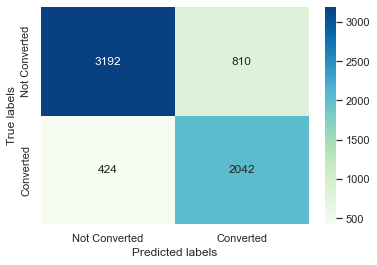

In [116]:
#Plotting the Confusion Matrix
draw_cm( y_train_pred_final['Converted_Value'], y_train_pred_final['final_predicted_1'], "GnBu")

In [117]:
conf_matrix = confusion_matrix(y_train_pred_final['Converted_Value'], y_train_pred_final['final_predicted_1'] )

lg_metrics(conf_matrix)

Model Accuracy value is              :  80.92 %
Model Sensitivity value is           :  82.81 %
Model Specificity value is           :  79.76 %
Model Precision value is             :  71.6 %
Model Recall value is                :  82.81 %
Model True Positive Rate (TPR)       :  82.81 %
Model False Positive Rate (FPR)      :  20.24 %
Model Poitive Prediction Value is    :  71.6 %
Model Negative Prediction value is   :  88.27 %


In [118]:

# Classification Record : Precision, Recall and F1 Score
print( metrics.classification_report( y_train_pred_final['Converted_Value'], y_train_pred_final['final_predicted_1'] ) )

              precision    recall  f1-score   support

           0       0.88      0.80      0.84      4002
           1       0.72      0.83      0.77      2466

    accuracy                           0.81      6468
   macro avg       0.80      0.81      0.80      6468
weighted avg       0.82      0.81      0.81      6468



In [119]:
# Classification Record : Precision, Recall and F1 Score
print( metrics.classification_report( y_train_pred_final['Converted_Value'], y_train_pred_final['final_predicted_1'] ) )

              precision    recall  f1-score   support

           0       0.88      0.80      0.84      4002
           1       0.72      0.83      0.77      2466

    accuracy                           0.81      6468
   macro avg       0.80      0.81      0.80      6468
weighted avg       0.82      0.81      0.81      6468



Inference :

- Model 5 is providing an Accuracy of 80.71%, Sensitivity of 81.79%. Sensitivity in this case indicates how many leads the model identify correctly out of all potential leads which are converting. More than 80% is what the CEO has requested in this case study. F1 Score and precision value in the model has higher number for 0's than 1's. This indicates that the model predicts leads which will not convert ( i.e. filtering leads who will not convert) than the leads which will convert. This indirectly improved the model's performance to identify correct leads to be contacted

## 7.3 ROC Curve

In [120]:
# Function to plot ROC Curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None


In [121]:
# recoring the values FPR, TPR and Thresholds:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final['Converted_Value'], y_train_pred_final['Converted_Prob'] , drop_intermediate = False )

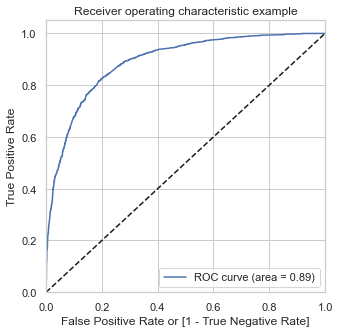

In [122]:
#plotting the ROC curve 
draw_roc(y_train_pred_final['Converted_Value'], y_train_pred_final['Converted_Prob'])

Inferences:

- ROC Curve aread is 0.89, which indicates that the model is good.

## 7.4 Precision - Recall Trade Off

Next we will look into Precision- Recall trade off to see if balancing these values provides better output.
Precision means out of all leads which are predicted at 1, how many have truly converted.
Recall means out of all leads that have converted, how many of them were correctly identifies as 1. This is the same value as sensitivity.

Precision-Recall trade-off point is used to decide the cut-off point especially when there is huge imbalance in data. In our case the data distribution is 62% vs 38%. So imbalance of data is not a big factor.

In [123]:
p, r, thresholds = precision_recall_curve(y_train_pred_final['Converted_Value'], y_train_pred_final['Converted_Prob'])

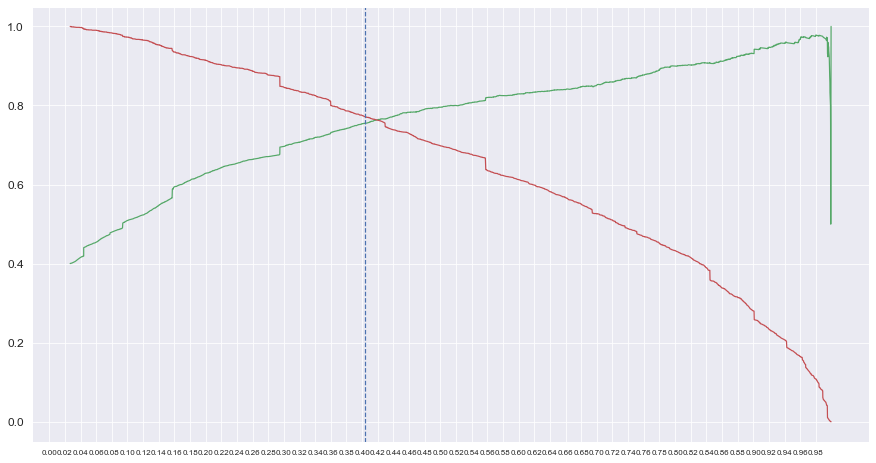

In [124]:
# Plotting the Precision-Recall Trade off Curve
plt.figure(figsize=(15,8))
sns.set_style("darkgrid")
sns.set_context("paper")
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.axvline(x=0.404, color='b', linestyle='--') # additing axline
plt.xticks(np.arange(0,1,step=0.02),size=8)
plt.yticks(size=12)

plt.show()

Based on Precision- Recall Trade off curve, the cutoff point seems to 0.404. We will use this threshold value for Test Data Evaluation

In [125]:
# plotting the Train dataset again with 0.42 as cutoff
y_train_pred_final['final_predicted_2'] = y_train_pred_final['Converted_Prob'].map( lambda x: 1 if x > 0.404 else 0)
y_train_pred_final.head()

,Converted_Value,Converted_Prob,final_predicted_1,lead_score_1,final_predicted_2
0,0,0.429203,1,42,1
1,0,0.167046,0,16,0
2,0,0.340234,1,34,0
3,0,0.826066,1,82,1
4,0,0.294733,0,29,0


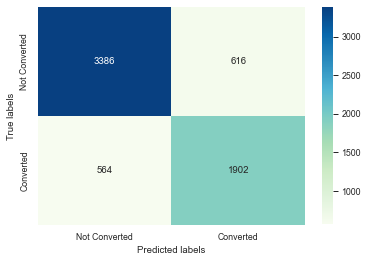

In [126]:
#Plotting the Confusion Matrix
draw_cm( y_train_pred_final['Converted_Value'], y_train_pred_final['final_predicted_2'], "GnBu")

In [127]:
#Data based on cutoff received from Precision-Recall Trade off
conf_matrix = confusion_matrix(y_train_pred_final['Converted_Value'], y_train_pred_final['final_predicted_2'] )
lg_metrics(conf_matrix)


Model Accuracy value is              :  81.76 %
Model Sensitivity value is           :  77.13 %
Model Specificity value is           :  84.61 %
Model Precision value is             :  75.54 %
Model Recall value is                :  77.13 %
Model True Positive Rate (TPR)       :  77.13 %
Model False Positive Rate (FPR)      :  15.39 %
Model Poitive Prediction Value is    :  75.54 %
Model Negative Prediction value is   :  85.72 %


In [128]:
# Classification Record : Precision, Recall and F1 Score
print( metrics.classification_report( y_train_pred_final['Converted_Value'], y_train_pred_final['final_predicted_2'] ) )

              precision    recall  f1-score   support

           0       0.86      0.85      0.85      4002
           1       0.76      0.77      0.76      2466

    accuracy                           0.82      6468
   macro avg       0.81      0.81      0.81      6468
weighted avg       0.82      0.82      0.82      6468



By using the Precision - Recall trade off chart cut-off points, the model output has changed the following way :
    
    
- True Positive number has decreased.
- True Negative number has increase
- False Negative number has increase
- False Positive number has decreased


For our purpose CEO wants to identify the people correctly who will convert to leads. Thus, we cannot use Precision-Recall trade-off method as it reduced True Positive. We have to increase Sensitivity / Recall value to increase True Positives. Thus we will use 0.34 as cutoff point.

# 8. Model Evaluation : Test Dataset

In [129]:
# Scaling the test dataset :
X_test[['Total Time Spent on Website','Page Views Per Visit','TotalVisits']] = scaler.transform(X_test[['Total Time Spent on Website','Page Views Per Visit','TotalVisits']])
X_test.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other Sources,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Occupation_Housewife,Occupation_Other,Occupation_Student,Occupation_Unemployed,Occupation_Unknown,Occupation_Working Professional,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Select,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,Specialization_Unknown
4269,0,1.749143,0.964504,2.117849,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2376,0,-1.149699,-0.885371,-1.266675,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
7766,0,0.662077,-0.777416,1.553761,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
9199,0,-1.149699,-0.885371,-1.266675,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4359,0,-1.149699,-0.885371,-1.266675,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [130]:
# Selecting only the columns used in final model of Train Dataset
X_test = X_test[features]
X_test.head()

,Do Not Email,Total Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Source_Olark Chat,Lead Source_Welingak Website,Occupation_Unknown,Occupation_Working Professional,Last Activity_Email Opened,Last Activity_Olark Chat Conversation,Last Activity_Other Activity,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Hospitality Management,Specialization_Select
4269,0,0.964504,0,0,0,0,1,0,0,0,0,1,0,0,0,0
2376,0,-0.885371,0,1,0,0,0,0,0,0,0,1,0,0,0,1
7766,0,-0.777416,0,0,0,0,0,1,0,0,0,0,1,0,0,0
9199,0,-0.885371,0,0,1,0,0,0,0,1,0,0,0,0,0,1
4359,0,-0.885371,0,1,0,0,0,0,1,0,0,0,0,0,0,0


In [131]:
#adding contant value
X_test_sm = sm.add_constant(X_test)
X_test_sm.columns

Index(['const', 'Do Not Email', 'Total Time Spent on Website',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Olark Chat', 'Lead Source_Welingak Website',
       'Occupation_Unknown', 'Occupation_Working Professional',
       'Last Activity_Email Opened', 'Last Activity_Olark Chat Conversation',
       'Last Activity_Other Activity', 'Last Activity_SMS Sent',
       'Last Activity_Unreachable', 'Last Activity_Unsubscribed',
       'Specialization_Hospitality Management', 'Specialization_Select'],
      dtype='object')

In [132]:
# Predicting the final test model 
y_test_pred = log_model5.predict(X_test_sm)

In [133]:
#checking the top 10 rows
y_test_pred[:10]

4269    0.589485
2376    0.900969
7766    0.787825
9199    0.093681
4359    0.844475
9186    0.582288
1631    0.506009
8963    0.196613
8007    0.029472
5324    0.362533
dtype: float64

In [134]:
# Converting y_pred to a dataframe which is an array
y_test_pred = pd.DataFrame(y_test_pred)
y_test_pred.head()

,0
4269,0.589485
2376,0.900969
7766,0.787825
9199,0.093681
4359,0.844475


In [135]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,Converted
4269,1
2376,1
7766,1
9199,0
4359,1


In [136]:
# Removing index for both dataframes to append them side by side 
y_test_pred.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_test_pred],axis=1)
y_pred_final.head()

,Converted,0
0,1,0.589485
1,1,0.900969
2,1,0.787825
3,0,0.093681
4,1,0.844475


In [137]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Converted_Prob'})
y_pred_final= y_pred_final.rename(columns={ 'Converted' : 'Converted_Value'})

# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Converted_Value','Converted_Prob'], axis=1)
y_pred_final.head()

,Converted_Value,Converted_Prob
0,1,0.589485
1,1,0.900969
2,1,0.787825
3,0,0.093681
4,1,0.844475


In [138]:
y_pred_final['final_predicted'] = y_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.335 else 0)
y_pred_final.head()

,Converted_Value,Converted_Prob,final_predicted
0,1,0.589485,1
1,1,0.900969,1
2,1,0.787825,1
3,0,0.093681,0
4,1,0.844475,1


Now we will use Cutoff point of 0.335 from Sentivity - Specificity - Accuracy cut-off points

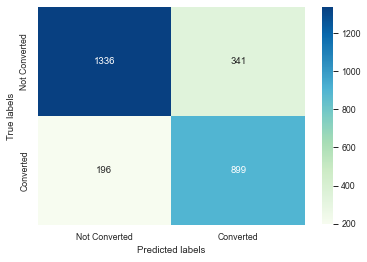

In [139]:
#Plotting the Confusion Matrix
draw_cm( y_pred_final['Converted_Value'], y_pred_final['final_predicted'], "GnBu")

In [140]:
conf_matrix = confusion_matrix(y_pred_final['Converted_Value'], y_pred_final['final_predicted'])

lg_metrics(conf_matrix)

Model Accuracy value is              :  80.63 %
Model Sensitivity value is           :  82.1 %
Model Specificity value is           :  79.67 %
Model Precision value is             :  72.5 %
Model Recall value is                :  82.1 %
Model True Positive Rate (TPR)       :  82.1 %
Model False Positive Rate (FPR)      :  20.33 %
Model Poitive Prediction Value is    :  72.5 %
Model Negative Prediction value is   :  87.21 %


Inferences:

- The sensitivity value on Test data is 82.1% vs 77.13% in Train data. The accuracy values is 80.63%. It shows that model is performing well in test data set also and is not over-trained.

In [141]:
# Classification Record : Precision, Recall and F1 Score
print( metrics.classification_report( y_pred_final['Converted_Value'], y_pred_final['final_predicted'] ) )

              precision    recall  f1-score   support

           0       0.87      0.80      0.83      1677
           1       0.72      0.82      0.77      1095

    accuracy                           0.81      2772
   macro avg       0.80      0.81      0.80      2772
weighted avg       0.81      0.81      0.81      2772



In [142]:
# Let's assign Lead_score for the leads in Test Data Set : 
y_pred_final['lead_score']=(y_pred_final['Converted_Prob']*100).astype("int64")
y_pred_final.sort_values(by='Converted_Prob',ascending=False)

,Converted_Value,Converted_Prob,final_predicted,lead_score
546,1,0.998732,1,99
1026,1,0.998331,1,99
2405,1,0.997694,1,99
745,1,0.997596,1,99
605,1,0.997477,1,99
2589,1,0.997214,1,99
1091,1,0.997127,1,99
1853,1,0.997026,1,99
931,0,0.996995,1,99
953,1,0.996662,1,99


In [143]:
# checking the data from top 
y_pred_final.head(5)

,Converted_Value,Converted_Prob,final_predicted,lead_score
0,1,0.589485,1,58
1,1,0.900969,1,90
2,1,0.787825,1,78
3,0,0.093681,0,9
4,1,0.844475,1,84


In [144]:
# checking the data from bottom 
y_pred_final.tail(5)

,Converted_Value,Converted_Prob,final_predicted,lead_score
2767,0,0.026558,0,2
2768,1,0.900969,1,90
2769,0,0.294733,0,29
2770,0,0.102519,0,10
2771,1,0.900969,1,90


# 9. Model Features/ Predictors

In [145]:
# Let's look into final model features and coefficients 
pd.options.display.float_format = '{:.2f}'.format
final_parameters = log_model5.params[1:]
final_parameters

Do Not Email                            -1.18
Total Time Spent on Website              1.08
Lead Origin_Landing Page Submission     -0.63
Lead Origin_Lead Add Form                3.04
Lead Source_Olark Chat                   1.07
Lead Source_Welingak Website             2.27
Occupation_Unknown                      -1.40
Occupation_Working Professional          2.43
Last Activity_Email Opened               0.80
Last Activity_Olark Chat Conversation   -0.60
Last Activity_Other Activity             2.24
Last Activity_SMS Sent                   1.90
Last Activity_Unreachable                0.92
Last Activity_Unsubscribed               1.42
Specialization_Hospitality Management   -0.92
Specialization_Select                   -0.59
dtype: float64

In [146]:
#Getting a relative coeffient value for all the features wrt the feature with the highest coefficient

top_predictors = final_parameters
top_predictors = 100.0 * (top_predictors / top_predictors.max())
top_predictors.sort_values()

Occupation_Unknown                      -45.84
Do Not Email                            -38.85
Specialization_Hospitality Management   -30.20
Lead Origin_Landing Page Submission     -20.81
Last Activity_Olark Chat Conversation   -19.74
Specialization_Select                   -19.30
Last Activity_Email Opened               26.16
Last Activity_Unreachable                30.08
Lead Source_Olark Chat                   35.05
Total Time Spent on Website              35.62
Last Activity_Unsubscribed               46.61
Last Activity_SMS Sent                   62.41
Last Activity_Other Activity             73.52
Lead Source_Welingak Website             74.59
Occupation_Working Professional          79.74
Lead Origin_Lead Add Form               100.00
dtype: float64

# ------------------------------------ The End ----------------------------------- 